# Comparison of Bayesian Optimization using a RF with and without inclusion of previous data

In [37]:
import sys
import os
sys.path.append(os.path.abspath('..'))
from venus_ml import VenusDataset

In [38]:
config = {
    "file_path": "../data/acc_watch_data.parquet",
    "input_columns": [],
    "output_columns": [],
}



dataset = VenusDataset(**config)
df = dataset.df
print(df.shape)

feature_groups = {
    "S": ["inj_mbar", "bias_v", "bias_i", "extraction_i"],
    "M": ["inj_mbar", "bias_v", "bias_i", "extraction_i", "ext_mbar", "k18_fw", "k18_ref", "g28_fw", "puller_i"],
    "L": ["inj_mbar", "bias_v", "bias_i", "extraction_i", "ext_mbar", "k18_fw", "k18_ref", "g28_fw", "puller_i", "inj_i", "ext_i", "mid_i", "sext_i", "x_ray_source", "x_ray_exit"],
}
print(df['run_id'].unique())

(29290, 170)
['00' '01' '02' '03' '04' '05' '06' '08' '08a' '08b' '08c' '08d' '09' '10'
 '10b' '11' '11b' '12' '13' '14']


In [39]:
def get_features(names, mean=True, std=False):
    out_list = []
    for name in names:
        if mean:
            out_list.append(name + "_mean")
        if std:
            out_list.append(name + "_std")
    return out_list

In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import re
import math
import time
from tqdm.notebook import tqdm

# Scikit-learn
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.exceptions import NotFittedError
from sklearn.metrics.pairwise import euclidean_distances

# Scikit-optimize
from skopt import Optimizer
from skopt.space import Real

# Plotting style
plt.style.use('seaborn-v0_8-deep')


## BO Helpers

In [41]:
class RFSurrogateWrapper(BaseEstimator, RegressorMixin):
    """
    A wrapper around sklearn's RandomForestRegressor that implements
    predict with return_std=True by calculating the standard deviation
    across tree predictions. Allows using a configurable RF within skopt.
    """
    def __init__(self, n_estimators=100, random_state=None, n_jobs=-1, **rf_kwargs):
        self.n_estimators = n_estimators
        self.random_state = random_state
        self.n_jobs = n_jobs # Ensure n_jobs is used
        self.rf_kwargs = rf_kwargs
        self.model = RandomForestRegressor(
            n_estimators=self.n_estimators,
            random_state=self.random_state,
            n_jobs=self.n_jobs,
            **self.rf_kwargs
        )

    def fit(self, X, y):
        X, y = check_X_y(X, y, accept_sparse=False, y_numeric=True)
        self.model.fit(X, y)
        self.is_fitted_ = True
        return self

    def predict(self, X, return_std=False):
        X = check_array(X, accept_sparse=False)
        check_is_fitted(self, 'is_fitted_')

        if not return_std:
            return self.model.predict(X)
        else:
            if not hasattr(self.model, 'estimators_') or not self.model.estimators_:
                 raise NotFittedError("RF model not fitted or no estimators.")

            tree_predictions = np.array([tree.predict(X) for tree in self.model.estimators_])
            mean_prediction = np.mean(tree_predictions, axis=0)
            std_prediction = np.std(tree_predictions, axis=0)
            return mean_prediction, std_prediction

    def get_params(self, deep=True):
        params = self.model.get_params(deep=deep)
        params['n_estimators'] = self.n_estimators
        params['random_state'] = self.random_state
        params['n_jobs'] = self.n_jobs
        params.update(self.rf_kwargs)
        return params

    def set_params(self, **params):
        model_params = {}
        wrapper_specific_params = ['n_estimators', 'random_state', 'n_jobs'] # Add more if any

        for key, value in params.items():
            if key in wrapper_specific_params:
                setattr(self, key, value)
            # Collect all params that could belong to the RF model
            model_params[key] = value

        # Re-initialize or set params on the model
        # For simplicity, we re-initialize here if core params change
        # A more sophisticated set_params would update self.model.set_params()
        # and handle self.rf_kwargs
        self.model = RandomForestRegressor(
            n_estimators=self.n_estimators,
            random_state=self.random_state,
            n_jobs=self.n_jobs,
            **{k: v for k, v in model_params.items() if k not in wrapper_specific_params and hasattr(RandomForestRegressor(), k)}
        )
        # Update rf_kwargs with any remaining valid RF params
        self.rf_kwargs = {k: v for k, v in model_params.items()
                          if k not in wrapper_specific_params and
                          hasattr(RandomForestRegressor(), k) and
                          k not in ['n_estimators', 'random_state', 'n_jobs']}
        return self


In [42]:
def get_scaled_data(df, run_ids, feature_cols, target_col, scaler=None, fit_scaler=False):
    """
    Filters data for given run_ids, selects features and target, and scales features.
    """
    df_filtered = df[df['run_id'].isin(run_ids)].copy()
    if df_filtered.empty:
        return pd.DataFrame(columns=feature_cols), pd.Series(dtype=float), scaler, []

    X = df_filtered[feature_cols]
    y = df_filtered[target_col]
    original_indices = df_filtered.index.tolist()

    if fit_scaler:
        scaler = StandardScaler()
        X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=feature_cols, index=X.index)
    elif scaler is not None:
        X_scaled = pd.DataFrame(scaler.transform(X), columns=feature_cols, index=X.index)
    else: # No scaling if no scaler provided and not fitting
        X_scaled = X.copy()

    return X_scaled, y, scaler, original_indices


def find_nearest_available_point(x_suggested_scaled, X_available_scaled,
                                 y_available_true, available_original_indices):
    """
    Finds the nearest available point in X_available_scaled to x_suggested_scaled.

    Args:
        x_suggested_scaled (np.array): The point suggested by optimizer.ask() (scaled).
        X_available_scaled (pd.DataFrame): DataFrame of available points' features (scaled).
        y_available_true (pd.Series): Series of true target values for available points.
        available_original_indices (list): List of original df indices for available points.

    Returns:
        tuple: (original_df_index, x_nearest_scaled_array, y_nearest_true_value) or (None, None, None)
    """
    if X_available_scaled.empty:
        return None, None, None

    distances = euclidean_distances(x_suggested_scaled.reshape(1, -1), X_available_scaled.values)
    nearest_idx_in_available = np.argmin(distances)

    original_df_idx = available_original_indices[nearest_idx_in_available]
    x_nearest_scaled_array = X_available_scaled.iloc[nearest_idx_in_available].values
    y_nearest_true_value = y_available_true.iloc[nearest_idx_in_available]

    return original_df_idx, x_nearest_scaled_array, y_nearest_true_value


In [43]:


def run_bo_on_discrete_data(
    df,
    target_run_id,
    feature_group_cols,
    target_col,
    base_estimator_type="RF", # New: "RF" or "GP"
    pretrain_run_ids=None,    # Pretraining mainly applies to RF
    n_initial_points_target_run=5,
    n_bo_iterations=20,
    skopt_optimizer_params=None,
    rf_wrapper_params=None,   # Specific to RF
    gp_kernel_params=None,    # Specific to GP (if customizing beyond skopt default)
    random_state=None
):
    """
    Performs Bayesian Optimization on a discrete dataset for a target run_id,
    allowing choice between RF and GP surrogates.
    Pretraining is primarily designed for the RF surrogate.
    """
    scenario_name = f"{base_estimator_type}"
    if base_estimator_type == "RF" and pretrain_run_ids:
        scenario_name += " with Pretraining"
    elif base_estimator_type == "RF":
        scenario_name += " no Pretraining"
    else: # GP
        scenario_name += " (no pretraining concept applied)"


    print(f"--- Starting BO for Target Run ID: {target_run_id} (Surrogate: {scenario_name}) ---")
    print(f"Features: {feature_group_cols}")
    print(f"Target: {target_col}")
    if base_estimator_type == "RF" and pretrain_run_ids:
        print(f"Pretraining with Run IDs: {pretrain_run_ids}")


    # --- 1. Data Preparation and Scaling ---
    scaler = StandardScaler()
    # For GP, pretraining data isn't used to 'tell' the optimizer in the same way.
    # The scaler should still be fit on all data the BO process might see on the target run,
    # plus pretrain data if RF is used, to ensure consistent space definition.
    all_ids_for_scaler_and_space = (pretrain_run_ids if base_estimator_type == "RF" and pretrain_run_ids else []) + [target_run_id]

    df_for_scaling_and_space_features = df[df['run_id'].isin(all_ids_for_scaler_and_space)][feature_group_cols].copy()

    if df_for_scaling_and_space_features.empty:
        print("No data found for any relevant run_ids for scaling. Cannot proceed.")
        return None
    try:
        scaler.fit(df_for_scaling_and_space_features)
    except ValueError as e:
        print(f"Error fitting scaler: {e}."); return None

    # Get scaled pretrain data (only if RF and pretrain_run_ids provided)
    X_pretrain_scaled, y_pretrain = pd.DataFrame(), pd.Series(dtype=float)
    if base_estimator_type == "RF" and pretrain_run_ids:
        X_pretrain_scaled, y_pretrain, _, _ = get_scaled_data(
            df, pretrain_run_ids, feature_group_cols, target_col,
            scaler=scaler, fit_scaler=False
        )

    X_target_all_scaled, y_target_all, _, target_original_indices = get_scaled_data(
        df, [target_run_id], feature_group_cols, target_col,
        scaler=scaler, fit_scaler=False
    )

    if X_target_all_scaled.empty:
        print(f"No data for target run ID: {target_run_id} after scaling. Skipping."); return None
    df_target_run_original_features = df.loc[target_original_indices, feature_group_cols].copy()

    # --- 2. Define Search Space ---
    X_combined_for_space_definition_scaled = pd.DataFrame(
        scaler.transform(df_for_scaling_and_space_features),
        columns=feature_group_cols, index=df_for_scaling_and_space_features.index
    )
    space = []
    for col in feature_group_cols:
        min_val = X_combined_for_space_definition_scaled[col].min()
        max_val = X_combined_for_space_definition_scaled[col].max()
        if pd.isna(min_val) or pd.isna(max_val): min_val, max_val = -5.0, 5.0
        elif min_val == max_val: min_val -= 0.1; max_val += 0.1
        space.append(Real(min_val, max_val, name=col))

    # --- 3. Initialize Surrogate and skopt.Optimizer ---
    actual_base_estimator = None
    if base_estimator_type == "RF":
        rf_params = rf_wrapper_params.copy() if rf_wrapper_params else {}
        rf_params.setdefault('random_state', random_state); rf_params.setdefault('n_jobs', -1)
        actual_base_estimator = RFSurrogateWrapper(**rf_params)
    elif base_estimator_type == "GP":
        actual_base_estimator = "GP" # Use skopt's default GP
        if gp_kernel_params: # If you want to pass kernel params to skopt's GP
            # This is more advanced; skopt.Optimizer takes 'base_estimator' as string or object.
            # To customize GP kernel for skopt.Optimizer, you might need to pass an
            # instantiated sklearn.gaussian_process.GaussianProcessRegressor.
            # For now, we assume default GP or that skopt_optimizer_params handles it.
            print("Note: Custom GP kernel params for skopt.Optimizer are advanced to set here.")
            pass
    else:
        raise ValueError(f"Unsupported base_estimator_type: {base_estimator_type}")

    opt_params = skopt_optimizer_params.copy() if skopt_optimizer_params else {}
    optimizer = Optimizer(
        dimensions=space,
        base_estimator=actual_base_estimator,
        acq_func=opt_params.get('acq_func', 'EI'),
        acq_func_kwargs=opt_params.get('acq_func_kwargs', {'xi': 0.01}),
        acq_optimizer=opt_params.get('acq_optimizer', 'sampling' if base_estimator_type == "RF" else "lbfgs"), # Default lbfgs for GP
        random_state=random_state
    )

    # --- 4. History Tracking ---
    # ... (same as before) ...
    sampled_points_original_features, sampled_target_values = [], []
    best_target_value_history, best_params_original_history = [], []
    current_best_target, current_best_params_original = -np.inf, None


    # --- 5. Pretraining Phase (Only for RF with pretrain_run_ids) ---
    if base_estimator_type == "RF" and not X_pretrain_scaled.empty:
        print(f"Telling optimizer with {len(X_pretrain_scaled)} pretraining points (RF specific)...")
        try:
            optimizer.tell(X_pretrain_scaled.values.tolist(), (-y_pretrain).values.tolist())
        except ValueError as e:
            print(f"ValueError during RF pretraining tell: {e}"); return None # Stop if pretraining fails
        if len(y_pretrain) > 0 and not y_pretrain.isna().all():
            best_idx_pretrain = y_pretrain.idxmax()
            if y_pretrain[best_idx_pretrain] > current_best_target:
                current_best_target = y_pretrain[best_idx_pretrain]
                current_best_params_original = df.loc[best_idx_pretrain, feature_group_cols].to_dict()

    # --- 6. Initial Random Points from Target Run ---
    # ... (this section remains largely the same, ensure it uses df_target_run_original_features for logging) ...
    all_original_df_indices_for_target_run = list(X_target_all_scaled.index)
    if not all_original_df_indices_for_target_run:
        if not (base_estimator_type == "RF" and not X_pretrain_scaled.empty) and n_bo_iterations > 0:
             print("No target data, and no RF pretraining. Cannot proceed."); return None
        elif n_bo_iterations == 0: # No BO iterations, and no initial points from target
             print("No target data and no BO iterations. Cannot proceed."); return None
        else: # RF pretraining might have happened, or GP will start from scratch
             print("No data points in the target run for initial sampling. BO will rely on ask() if possible.")
    
    np.random.shuffle(all_original_df_indices_for_target_run)
    actual_n_initial = min(n_initial_points_target_run, len(all_original_df_indices_for_target_run))
    initial_points_original_df_indices = all_original_df_indices_for_target_run[:actual_n_initial]
    available_original_df_indices_for_bo = all_original_df_indices_for_target_run[actual_n_initial:]
    used_original_df_indices_in_target_run = set()

    print(f"Telling optimizer with {actual_n_initial} initial points from target run...")
    for original_df_idx in initial_points_original_df_indices:
        if original_df_idx not in X_target_all_scaled.index: continue
        x_init_scaled = X_target_all_scaled.loc[original_df_idx].values.tolist()
        y_init_true = y_target_all.loc[original_df_idx]
        if pd.isna(y_init_true): continue
        try: optimizer.tell([x_init_scaled], [-y_init_true])
        except ValueError as e: print(f"ValueError for initial point {original_df_idx}: {e}"); continue
        
        used_original_df_indices_in_target_run.add(original_df_idx)
        sampled_points_original_features.append(df_target_run_original_features.loc[original_df_idx].to_dict())
        sampled_target_values.append(y_init_true)
        if y_init_true > current_best_target:
            current_best_target = y_init_true
            current_best_params_original = df_target_run_original_features.loc[original_df_idx].to_dict()
        best_target_value_history.append(current_best_target)
        best_params_original_history.append(current_best_params_original)


    # --- 7. Main BO Loop ---
    # ... (this section remains largely the same, ensure it uses df_target_run_original_features for logging) ...
    print(f"Starting BO loop for {n_bo_iterations} iterations...")
    for bo_iter in range(n_bo_iterations):
        if not available_original_df_indices_for_bo:
            # If no points are available from target, but we had pretraining (for RF) or it's GP (can suggest from model)
            # we might still be able to ask if the model is sufficiently trained.
            # However, for discrete data, if no target points are left, we must stop.
            print("No more available points in target run for BO. Stopping BO."); break
        try:
            x_suggested_scaled = np.array(optimizer.ask())
        except Exception as e:
            print(f"Error during optimizer.ask(): {e}. Points told: {len(optimizer.Xi) if hasattr(optimizer, 'Xi') and optimizer.Xi is not None else 'N/A'}."); break
        
        X_available_now_scaled = X_target_all_scaled.loc[available_original_df_indices_for_bo]
        y_available_now_true = y_target_all.loc[available_original_df_indices_for_bo]
        if X_available_now_scaled.empty: print("No points in X_available_now_scaled. Stopping BO."); break

        chosen_original_df_idx, x_chosen_scaled, y_chosen_true = find_nearest_available_point(
            x_suggested_scaled, X_available_now_scaled, y_available_now_true,
            available_original_df_indices_for_bo
        )
        if chosen_original_df_idx is None: print("NN search failed. Stopping BO."); break
        if pd.isna(y_chosen_true):
            try: available_original_df_indices_for_bo.remove(chosen_original_df_idx)
            except ValueError: pass; continue

        try: optimizer.tell([x_chosen_scaled.tolist()], [-y_chosen_true])
        except ValueError as e:
            print(f"ValueError for BO point {chosen_original_df_idx}: {e}")
            try: available_original_df_indices_for_bo.remove(chosen_original_df_idx)
            except ValueError: pass; continue
        
        used_original_df_indices_in_target_run.add(chosen_original_df_idx)
        try: available_original_df_indices_for_bo.remove(chosen_original_df_idx)
        except ValueError: print(f"Warning: Could not remove {chosen_original_df_idx} from available list (already removed?).")

        sampled_points_original_features.append(df_target_run_original_features.loc[chosen_original_df_idx].to_dict())
        sampled_target_values.append(y_chosen_true)
        if y_chosen_true > current_best_target:
            current_best_target = y_chosen_true
            current_best_params_original = df_target_run_original_features.loc[chosen_original_df_idx].to_dict()
        best_target_value_history.append(current_best_target)
        best_params_original_history.append(current_best_params_original)

    print(f"--- BO Finished ({base_estimator_type}) ---")
    # ... (rest of the function, results dictionary, etc. remains the same) ...
    if current_best_params_original is not None:
        print(f"Best target value found: {current_best_target:.4f}")
        print(f"Best parameters (original features): {current_best_params_original}")
    else: print("No points successfully evaluated or no initial best found.")

    results = {
        "scenario_name": scenario_name, # Added for clarity in plots
        "base_estimator_type": base_estimator_type,
        "sampled_points_original_features": sampled_points_original_features,
        "sampled_target_values": sampled_target_values,
        "best_target_value_history": best_target_value_history,
        "best_params_original_history": best_params_original_history,
        "feature_cols": feature_group_cols, "target_col": target_col,
        "target_run_id": target_run_id, "scaler": scaler,
        "final_optimizer_state": optimizer.get_result() if hasattr(optimizer, 'get_result') else None,
        "used_original_df_indices_in_target_run": list(used_original_df_indices_in_target_run),
        "n_initial_points_target_run_actual": actual_n_initial # Store actual initial points used
    }
    return results


In [44]:
def plot_bo_discrete_results(results, df_full_dataset):
    """
    Plots the results of BO on discrete data.
    """
    if results is None:
        print("No results to plot.")
        return

    sampled_points_orig = results["sampled_points_original_features"]
    best_target_history = results["best_target_value_history"]
    best_params_orig_history = results["best_params_original_history"]
    feature_cols = results["feature_cols"]
    target_col = results["target_col"]
    target_run_id = results["target_run_id"]
    n_iterations = len(best_target_history)

    # Find the true maximum for the target run in the full dataset
    df_target_run = df_full_dataset[df_full_dataset['run_id'] == target_run_id]
    if df_target_run.empty:
        print(f"Cannot find data for target run ID {target_run_id} in full dataset for plotting true max.")
        true_max_value = np.nan
        true_max_params_original = {col: np.nan for col in feature_cols}
    else:
        true_max_idx = df_target_run[target_col].idxmax()
        true_max_value = df_target_run.loc[true_max_idx, target_col]
        true_max_params_original = df_target_run.loc[true_max_idx, feature_cols].to_dict()

    print(f"\nPlotting for Target Run ID: {target_run_id}")
    print(f"True Max Value in Target Run: {true_max_value:.4f}")
    print(f"Parameters at True Max: {true_max_params_original}")


    # --- Plotting Setup ---
    num_feature_plots = len(feature_cols)
    total_plots = num_feature_plots + 1 # +1 for performance plot
    # Try to make it somewhat square, or max 3-4 cols
    plot_cols = min(math.ceil(math.sqrt(total_plots)), 4)
    plot_rows = math.ceil(total_plots / plot_cols)

    fig, axs = plt.subplots(plot_rows, plot_cols, figsize=(6 * plot_cols, 5 * plot_rows), squeeze=False)
    fig.suptitle(f"BO Results for Run ID: {target_run_id} (Features: {len(feature_cols)})", fontsize=16, y=1.0)
    axs_flat = axs.flatten()

    iterations_axis = np.arange(1, n_iterations + 1)
    colors = plt.cm.viridis(np.linspace(0, 0.85, num_feature_plots))

    # --- Feature Evolution Plots ---
    for i, feature_name in enumerate(feature_cols):
        ax = axs_flat[i]
        sampled_feature_values = [p[feature_name] for p in sampled_points_orig]
        ax.scatter(iterations_axis, sampled_feature_values, s=10, alpha=0.7, label=f"Sampled {feature_name}", c=[colors[i]])
        if not np.isnan(true_max_params_original[feature_name]):
            ax.axhline(true_max_params_original[feature_name], color=colors[i], linestyle='--',
                       linewidth=2, label=f"Optimal {feature_name} ({true_max_params_original[feature_name]:.3f})")
        ax.set_xlabel("BO Iteration (after initial/pretrain)")
        ax.set_ylabel(f"{feature_name} Value")
        ax.set_title(f"Evolution of {feature_name}")
        ax.legend(fontsize='small', loc='best')
        ax.grid(True, linestyle=':')

    # --- Performance Plot (% Difference from True Max) ---
    ax_perf = axs_flat[num_feature_plots]
    if not np.isnan(true_max_value):
        perc_diffs = []
        denom = abs(true_max_value)
        use_abs_diff = denom < 1e-9 # Handle true_max being zero or very small

        for val_found in best_target_history:
            if use_abs_diff:
                diff = abs(true_max_value - val_found)
                perc = diff * 100 # Or some other scale if true_max is tiny
            else:
                # % difference from max, where 0% is optimal
                diff = max(0, true_max_value - val_found) / denom * 100
            perc_diffs.append(diff)

        ax_perf.plot(iterations_axis, perc_diffs, marker='.', linestyle='-', color='red')
        ax_perf.axhline(0, color='black', linestyle='--', linewidth=1.5) # Line at 0% diff
        ax_perf.set_ylabel("% Difference from True Max")
        ax_perf.set_ylim(bottom=-5, top=max(10, np.max(perc_diffs) * 1.1 if perc_diffs else 10)) # Dynamic upper limit
    else:
        ax_perf.text(0.5, 0.5, "True max for target run not available for % diff.",
                     ha='center', va='center', transform=ax_perf.transAxes)

    ax_perf.set_xlabel("BO Iteration (after initial/pretrain)")
    ax_perf.set_title(f"Performance vs True Max ({true_max_value:.4f})")
    ax_perf.grid(True, linestyle=':')


    # Turn off any unused subplots
    for i in range(total_plots, len(axs_flat)):
        axs_flat[i].axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust for suptitle
    plt.show()



In [45]:
def plot_pretrain_comparison_results(
    results_no_pretrain,
    results_with_pretrain,
    df_full_dataset,
    target_run_id_for_true_max,
    feature_cols_for_true_max,
    target_col_for_true_max,
    initial_points_count_no_pretrain,  # New argument
    initial_points_count_with_pretrain # New argument
):
    """
    Plots a 2x2 comparison with burn-in line:
    Top row: No Pretraining (Normalized Features Scatter, Performance)
    Bottom row: With Pretraining (Normalized Features Scatter, Performance)
    """
    fig, axs = plt.subplots(2, 2, figsize=(16, 12), sharex='col')
    fig.suptitle(f"BO Pretraining Comparison for Target Run ID: {target_run_id_for_true_max}", fontsize=16, y=1.02)

    # --- Determine True Max for the Target Run (once) ---
    df_target_run = df_full_dataset[df_full_dataset['run_id'] == target_run_id_for_true_max]
    true_max_value = np.nan
    true_max_params_original = {col: np.nan for col in feature_cols_for_true_max}

    if df_target_run.empty or target_col_for_true_max not in df_target_run.columns:
        print(f"Warning: Cannot find data or target col for target run ID {target_run_id_for_true_max} for plotting true max.")
    else:
        if not df_target_run[target_col_for_true_max].isna().all():
            true_max_idx = df_target_run[target_col_for_true_max].idxmax()
            true_max_value = df_target_run.loc[true_max_idx, target_col_for_true_max]
            true_max_params_original = df_target_run.loc[true_max_idx, feature_cols_for_true_max].to_dict()
        else:
            print(f"Warning: Target column '{target_col_for_true_max}' is all NaN for run {target_run_id_for_true_max}.")


    run_data_map = {
        "No Pretraining": (results_no_pretrain, axs[0, 0], axs[0, 1], initial_points_count_no_pretrain),
        "With Pretraining": (results_with_pretrain, axs[1, 0], axs[1, 1], initial_points_count_with_pretrain)
    }

    for run_name, (results, ax_features, ax_perf, initial_points_count) in run_data_map.items():
        ax_features.set_title(f"{run_name}: Feature Evolution (Normalized 0-1)")
        ax_perf.set_title(f"{run_name}: Performance vs Max")
        ax_features.set_ylabel("Normalized Parameter Value (0-1)")
        ax_perf.set_ylabel("% Difference from True Max")
        ax_features.grid(True, linestyle=':')
        ax_perf.grid(True, linestyle=':')
        ax_perf.axhline(0, color='black', linestyle='--', linewidth=1.0)
        ax_perf.set_ylim(bottom=-5)
        ax_features.set_ylim(-0.05, 1.05)

        if results is None or not results["best_target_value_history"]:
            ax_features.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax_features.transAxes)
            ax_perf.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax_perf.transAxes)
            continue

        sampled_points_orig_dicts = results["sampled_points_original_features"]
        best_target_history = results["best_target_value_history"]
        feature_cols = feature_cols_for_true_max
        n_total_samples_in_log = len(best_target_history)
        iterations_axis = np.arange(1, n_total_samples_in_log + 1)

        # --- Add vertical line for switch from random to acquisition ---
        # The `initial_points_count` refers to points taken from the *target run*
        # before the BO loop (optimizer.ask()) starts.
        # The x-axis `iterations_axis` starts from 1.
        # The line should be after the last initial point.
        # Note: The history includes these initial points.
        burn_in_line_drawn = False
        if initial_points_count > 0 and initial_points_count < n_total_samples_in_log:
            ax_features.axvline(initial_points_count + 0.5, color='grey', linestyle='--', linewidth=1.2, label='Acq. Start')
            ax_perf.axvline(initial_points_count + 0.5, color='grey', linestyle='--', linewidth=1.2)
            burn_in_line_drawn = True


        # Plot Feature Evolution (Normalized and Scatter)
        if sampled_points_orig_dicts:
            colors = plt.cm.viridis(np.linspace(0, 0.85, len(feature_cols)))
            df_sampled_features = pd.DataFrame(sampled_points_orig_dicts)

            feature_handles_labels = {} # To collect unique feature labels for legend

            for i, feature_name in enumerate(feature_cols):
                if feature_name not in df_sampled_features.columns:
                    continue
                sampled_feature_values_raw = df_sampled_features[feature_name].values.reshape(-1, 1)
                min_val_feature = np.nanmin(sampled_feature_values_raw)
                max_val_feature = np.nanmax(sampled_feature_values_raw)
                sampled_feature_values_normalized = sampled_feature_values_raw.copy()
                if not (pd.isna(min_val_feature) or pd.isna(max_val_feature) or min_val_feature == max_val_feature):
                    sampled_feature_values_normalized = (sampled_feature_values_raw - min_val_feature) / (max_val_feature - min_val_feature)
                elif not (pd.isna(min_val_feature) or pd.isna(max_val_feature) and min_val_feature == max_val_feature):
                    sampled_feature_values_normalized = np.full_like(sampled_feature_values_raw, 0.5)

                # Store handle for legend if not already done
                if feature_name not in feature_handles_labels:
                    scatter_handle = ax_features.scatter([], [], s=10, color=colors[i], label=feature_name) # Dummy scatter for legend
                    feature_handles_labels[feature_name] = scatter_handle

                ax_features.scatter(iterations_axis, sampled_feature_values_normalized.flatten(),
                                    s=10, alpha=0.7, color=colors[i]) # No label here to avoid duplicates

                optimal_val_raw = true_max_params_original.get(feature_name, np.nan)
                if not pd.isna(optimal_val_raw):
                    optimal_val_normalized = optimal_val_raw
                    if not (pd.isna(min_val_feature) or pd.isna(max_val_feature) or min_val_feature == max_val_feature):
                        optimal_val_normalized = (optimal_val_raw - min_val_feature) / (max_val_feature - min_val_feature)
                    elif not (pd.isna(min_val_feature) or pd.isna(max_val_feature) and min_val_feature == max_val_feature):
                         optimal_val_normalized = 0.5
                    optimal_val_normalized_clipped = np.clip(optimal_val_normalized, 0, 1)
                    ax_features.axhline(optimal_val_normalized_clipped, color=colors[i],
                                        linestyle=':', linewidth=1.5, alpha=0.6)
            
            # Create legend for features and potentially the burn-in line
            current_handles = list(feature_handles_labels.values())
            current_labels = list(feature_handles_labels.keys())
            if burn_in_line_drawn:
                # Check if 'Acq. Start' is already in legend from a previous axvline call (if any)
                # This logic might be redundant if axvline's label is handled by default legend
                legend_labels_on_ax = [text.get_text() for text in ax_features.get_legend_handles_labels()[1]] if ax_features.get_legend() else []
                if 'Acq. Start' not in legend_labels_on_ax:
                     current_handles.append(plt.Line2D([0], [0], color='grey', linestyle='--', linewidth=1.2))
                     current_labels.append('Acq. Start')
            
            if current_handles: # Only create legend if there's something to show
                ax_features.legend(current_handles, current_labels, fontsize='x-small', loc='best')


        # Plot Performance
        if not np.isnan(true_max_value):
            perc_diffs = []
            denom = abs(true_max_value)
            use_abs_diff = denom < 1e-9
            for val_found in best_target_history:
                if pd.isna(val_found): perc_diffs.append(np.nan); continue
                if use_abs_diff: diff = abs(true_max_value - val_found); perc = diff * 100
                else: diff = max(0, true_max_value - val_found) / denom * 100
                perc_diffs.append(diff)
            ax_perf.plot(iterations_axis, perc_diffs, marker='.', linestyle='-', color='red')
            if perc_diffs and np.sum(~np.isnan(perc_diffs)) > 0 : # Check if any non-NaN values exist
                 ax_perf.set_ylim(bottom=-5, top=max(10, np.nanmax(perc_diffs) * 1.1 ))
            else:
                 ax_perf.set_ylim(bottom=-5, top=10) # Default if no valid perc_diffs
        else:
            ax_perf.text(0.5, 0.5, "True max N/A", ha='center', va='center', transform=ax_perf.transAxes)

    axs[1, 0].set_xlabel("BO Iteration (Target Run Samples)")
    axs[1, 1].set_xlabel("BO Iteration (Target Run Samples)")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import re
import math
import time
from tqdm.notebook import tqdm

# Scikit-learn
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.exceptions import NotFittedError
from sklearn.metrics.pairwise import euclidean_distances

# Scikit-optimize
from skopt import Optimizer
from skopt.space import Real

# Plotting style
plt.style.use('seaborn-v0_8-deep')

# --- Ensure RFSurrogateWrapper, get_scaled_data, find_nearest_available_point, ---
# --- run_bo_on_discrete_data, and run_surrogate_comparison are defined above ---

def plot_surrogate_comparison_results(
    results_rf_no_pretrain,
    results_rf_with_pretrain,
    results_gp_no_pretrain,
    df_full_dataset,
    target_run_id_for_true_max,
    feature_cols_for_true_max,
    target_col_for_true_max,
    save_plot=False, # New argument to control saving
    plot_filename="bo_surrogate_comparison.png", # Default filename
    plot_directory="plots" # Default directory
):
    """
    Plots a 3x2 comparison using absolute percentage difference and allows saving.
    Row 1: RF No Pretrain (Normalized Features Scatter, Performance)
    Row 2: RF With Pretrain (Normalized Features Scatter, Performance)
    Row 3: GP No Pretrain (Normalized Features Scatter, Performance)
    """
    fig, axs = plt.subplots(3, 2, figsize=(16, 18), sharex='col')
    fig.suptitle(f"BO Surrogate Comparison for Target Run ID: {target_run_id_for_true_max}", fontsize=16, y=1.01)

    # --- Determine True Max for the Target Run (once) ---
    df_target_run = df_full_dataset[df_full_dataset['run_id'] == target_run_id_for_true_max]
    true_max_value = np.nan
    true_max_params_original = {col: np.nan for col in feature_cols_for_true_max}
    if not df_target_run.empty and target_col_for_true_max in df_target_run.columns:
        if not df_target_run[target_col_for_true_max].isna().all():
            true_max_idx = df_target_run[target_col_for_true_max].idxmax()
            true_max_value = df_target_run.loc[true_max_idx, target_col_for_true_max]
            true_max_params_original = df_target_run.loc[true_max_idx, feature_cols_for_true_max].to_dict()
        else: print(f"Warning: Target column '{target_col_for_true_max}' is all NaN for run {target_run_id_for_true_max}.")
    else: print(f"Warning: Cannot find data or target col for target run ID {target_run_id_for_true_max} for plotting true max.")

    run_data_map = [
        ("RF No Pretraining", results_rf_no_pretrain, axs[0, 0], axs[0, 1]),
        ("RF With Pretraining", results_rf_with_pretrain, axs[1, 0], axs[1, 1]),
        ("GP No Pretraining", results_gp_no_pretrain, axs[2, 0], axs[2, 1])
    ]

    for run_idx, (scenario_name_from_results, results, ax_features, ax_perf) in enumerate(run_data_map):
        plot_title_prefix = results.get("scenario_name", scenario_name_from_results) if results else scenario_name_from_results

        ax_features.set_title(f"{plot_title_prefix}: Features (Norm 0-1)")
        ax_perf.set_title(f"{plot_title_prefix}: Abs. % Diff from Max") # Updated title
        ax_features.set_ylabel("Norm. Param Value (0-1)")
        ax_perf.set_ylabel("Abs. % Diff from True Max") # Updated label
        ax_features.grid(True, linestyle=':'); ax_perf.grid(True, linestyle=':')
        ax_perf.axhline(0, color='black', linestyle='--', linewidth=1.0)
        # Y-lim for performance plot will be set dynamically based on data
        ax_features.set_ylim(-0.05, 1.05)

        if results is None or not results.get("best_target_value_history"):
            ax_features.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax_features.transAxes)
            ax_perf.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax_perf.transAxes)
            continue

        initial_points_count = results.get("n_initial_points_target_run_actual", 0)
        sampled_points_orig_dicts = results["sampled_points_original_features"]
        best_target_history = results["best_target_value_history"]
        feature_cols = feature_cols_for_true_max
        n_total_samples_in_log = len(best_target_history)
        iterations_axis = np.arange(1, n_total_samples_in_log + 1)
        burn_in_line_drawn = False

        if initial_points_count > 0 and initial_points_count < n_total_samples_in_log:
            ax_features.axvline(initial_points_count + 0.5, color='grey', linestyle='--', linewidth=1.2, label='Acq. Start')
            ax_perf.axvline(initial_points_count + 0.5, color='grey', linestyle='--', linewidth=1.2)
            burn_in_line_drawn = True
        
        if sampled_points_orig_dicts:
            colors = plt.cm.viridis(np.linspace(0, 0.85, len(feature_cols)))
            df_sampled_features = pd.DataFrame(sampled_points_orig_dicts)
            feature_handles_labels = {}
            for i, feature_name in enumerate(feature_cols):
                if feature_name not in df_sampled_features.columns: continue
                sampled_feature_values_raw = df_sampled_features[feature_name].values.reshape(-1, 1)
                min_val_feature = np.nanmin(sampled_feature_values_raw)
                max_val_feature = np.nanmax(sampled_feature_values_raw)
                sampled_feature_values_normalized = sampled_feature_values_raw.copy()
                if not (pd.isna(min_val_feature) or pd.isna(max_val_feature) or min_val_feature == max_val_feature):
                    sampled_feature_values_normalized = (sampled_feature_values_raw - min_val_feature) / (max_val_feature - min_val_feature)
                elif not (pd.isna(min_val_feature) or pd.isna(max_val_feature) and min_val_feature == max_val_feature):
                    sampled_feature_values_normalized = np.full_like(sampled_feature_values_raw, 0.5)
                if feature_name not in feature_handles_labels:
                    scatter_handle = ax_features.scatter([], [], s=10, color=colors[i], label=feature_name)
                    feature_handles_labels[feature_name] = scatter_handle
                ax_features.scatter(iterations_axis, sampled_feature_values_normalized.flatten(),
                                    s=10, alpha=0.7, color=colors[i])
                optimal_val_raw = true_max_params_original.get(feature_name, np.nan)
                if not pd.isna(optimal_val_raw):
                    optimal_val_normalized = optimal_val_raw
                    if not (pd.isna(min_val_feature) or pd.isna(max_val_feature) or min_val_feature == max_val_feature):
                        optimal_val_normalized = (optimal_val_raw - min_val_feature) / (max_val_feature - min_val_feature)
                    elif not (pd.isna(min_val_feature) or pd.isna(max_val_feature) and min_val_feature == max_val_feature):
                         optimal_val_normalized = 0.5
                    optimal_val_normalized_clipped = np.clip(optimal_val_normalized, 0, 1)
                    ax_features.axhline(optimal_val_normalized_clipped, color=colors[i],
                                        linestyle=':', linewidth=1.5, alpha=0.6)
            current_handles = list(feature_handles_labels.values())
            current_labels = list(feature_handles_labels.keys())
            if burn_in_line_drawn:
                legend_labels_on_ax = [text.get_text() for text in ax_features.get_legend_handles_labels()[1]] if ax_features.get_legend() else []
                if 'Acq. Start' not in legend_labels_on_ax:
                     current_handles.append(plt.Line2D([0], [0], color='grey', linestyle='--', linewidth=1.2))
                     current_labels.append('Acq. Start')
            if current_handles:
                ax_features.legend(current_handles, current_labels, fontsize='x-small', loc='best')

        # Plot Performance with ABSOLUTE PERCENTAGE DIFFERENCE
        if not np.isnan(true_max_value):
            abs_perc_diffs = []
            denom = abs(true_max_value)

            for val_found in best_target_history:
                if pd.isna(val_found):
                    abs_perc_diffs.append(np.nan)
                    continue
                
                diff_absolute_value = abs(true_max_value - val_found)
                
                if denom > 1e-9: # Avoid division by zero or very small numbers
                    perc = (diff_absolute_value / denom) * 100
                elif true_max_value == 0 and val_found == 0: # Both are zero
                    perc = 0.0
                elif true_max_value == 0 and val_found != 0: # True max is zero, found is not
                    perc = 100.0 # Or some other large number to indicate deviation from zero
                else: # Denom is very small, but not zero
                    perc = diff_absolute_value * 100 # Treat as absolute difference scaled by 100
                
                abs_perc_diffs.append(perc)
            
            ax_perf.plot(iterations_axis, abs_perc_diffs, marker='.', linestyle='-', color='red')
            
            # Dynamic y-axis for performance plot
            if abs_perc_diffs and np.sum(~np.isnan(abs_perc_diffs)) > 0:
                 min_perf_plot_y = -1 # Start slightly below 0 if all diffs are positive
                 max_perf_plot_y = max(5, np.nanmax(abs_perc_diffs) * 1.1) # Ensure at least 0-5 range
                 ax_perf.set_ylim(bottom=min_perf_plot_y, top=max_perf_plot_y)
            else:
                 ax_perf.set_ylim(bottom=-1, top=10) # Default if no valid perc_diffs
        else:
            ax_perf.text(0.5, 0.5, "True max N/A", ha='center', va='center', transform=ax_perf.transAxes)

    axs[2, 0].set_xlabel("BO Iteration (Target Run Samples)")
    axs[2, 1].set_xlabel("BO Iteration (Target Run Samples)")

    plt.tight_layout(rect=[0, 0, 1, 0.97])

    if save_plot:
        if not os.path.exists(plot_directory):
            try:
                os.makedirs(plot_directory)
                print(f"Created directory: {plot_directory}")
            except OSError as e:
                print(f"Error creating directory {plot_directory}: {e}. Plot not saved.")
                save_plot = False # Prevent save attempt

        if save_plot:
            full_plot_path = os.path.join(plot_directory, plot_filename)
            try:
                fig.savefig(full_plot_path, dpi=150, bbox_inches='tight')
                print(f"Comparison plot saved to: {full_plot_path}")
            except Exception as e:
                print(f"Error saving plot to {full_plot_path}: {e}")
    plt.show()


In [47]:
def compare_pretraining_effect(
    df,
    target_run_id,
    feature_group_cols,
    target_col,
    pretrain_run_ids_for_comparison,
    # Params for "no pretrain" run
    n_initial_points_no_pretrain,
    n_bo_iterations_no_pretrain,
    # Params for "with pretrain" run
    n_initial_points_with_pretrain,
    n_bo_iterations_with_pretrain,
    # Shared params
    skopt_optimizer_params=None,
    rf_wrapper_params=None,
    random_state_no_pretrain=None,
    random_state_with_pretrain=None,
    plot_comparison=True
):
    """
    Runs BO twice: once without pretraining and once with pretraining,
    then plots a comparison.
    """
    print(f"===== STARTING PRETRAINING COMPARISON FOR TARGET RUN ID: {target_run_id} =====")
    print(f"Features: {feature_group_cols}, Target: {target_col}")

    # --- Run 1: No Pretraining ---
    print("\n\n--- SCENARIO 1: NO PRETRAINING ---")
    results_no_pretrain = run_bo_on_discrete_data(
        df=df,
        target_run_id=target_run_id,
        feature_group_cols=feature_group_cols,
        target_col=target_col,
        pretrain_run_ids=[], # Empty list for no pretraining
        n_initial_points_target_run=n_initial_points_no_pretrain,
        n_bo_iterations=n_bo_iterations_no_pretrain,
        skopt_optimizer_params=skopt_optimizer_params,
        rf_wrapper_params=rf_wrapper_params,
        random_state=random_state_no_pretrain
    )

    # --- Run 2: With Pretraining ---
    print("\n\n--- SCENARIO 2: WITH PRETRAINING ---")
    results_with_pretrain = run_bo_on_discrete_data(
        df=df,
        target_run_id=target_run_id,
        feature_group_cols=feature_group_cols,
        target_col=target_col,
        pretrain_run_ids=pretrain_run_ids_for_comparison,
        n_initial_points_target_run=n_initial_points_with_pretrain,
        n_bo_iterations=n_bo_iterations_with_pretrain,
        skopt_optimizer_params=skopt_optimizer_params,
        rf_wrapper_params=rf_wrapper_params,
        random_state=random_state_with_pretrain
    )

    if plot_comparison:
        # Call the plotting function with the new arguments
        plot_pretrain_comparison_results(
            results_no_pretrain,
            results_with_pretrain,
            df_full_dataset=df,
            target_run_id_for_true_max=target_run_id,
            feature_cols_for_true_max=feature_group_cols,
            target_col_for_true_max=target_col,
            initial_points_count_no_pretrain=n_initial_points_no_pretrain, # Pass count
            initial_points_count_with_pretrain=n_initial_points_with_pretrain  # Pass count
        )

    # print(f"\n===== PRETRAINING COMPARISON FINISHED FOR TARGET RUN ID: {target_run_id} =====")
    return results_no_pretrain, results_with_pretrain

In [48]:
# --- Ensure RFSurrogateWrapper, get_scaled_data, find_nearest_available_point, ---
# --- and the updated run_bo_on_discrete_data are defined above ---

def run_surrogate_comparison(
    df,
    target_run_id,
    feature_group_cols,
    target_col,
    pretrain_run_ids_for_rf, # List of run_ids for RF "with pretraining" case
    # Params for RF "no pretrain" run
    n_initial_points_rf_no_pretrain,
    n_bo_iterations_rf_no_pretrain,
    # Params for RF "with pretrain" run
    n_initial_points_rf_with_pretrain,
    n_bo_iterations_rf_with_pretrain,
    # Params for GP "no pretrain" run
    n_initial_points_gp,
    n_bo_iterations_gp,
    # Shared params for skopt.Optimizer (can be overridden per surrogate type if needed)
    skopt_optimizer_params_rf=None,
    skopt_optimizer_params_gp=None, # Separate for GP if different acq_func etc.
    # RF specific params
    rf_wrapper_params=None,
    # GP specific params (e.g. kernel, though default skopt GP is often fine)
    gp_kernel_params=None,
    # Random states
    random_state_rf_no_pretrain=None,
    random_state_rf_with_pretrain=None,
    random_state_gp=None,
    plot_comparison=True
):
    """
    Runs BO with RF (no pretrain), RF (with pretrain), and GP (no pretrain),
    then plots a comparison.
    """
    print(f"===== STARTING SURROGATE COMPARISON FOR TARGET RUN ID: {target_run_id} =====")
    print(f"Features: {feature_group_cols}, Target: {target_col}")

    # --- Run 1: RF No Pretraining ---
    print("\n\n--- SCENARIO 1: RF NO PRETRAINING ---")
    results_rf_no_pretrain = run_bo_on_discrete_data(
        df=df, target_run_id=target_run_id, feature_group_cols=feature_group_cols, target_col=target_col,
        base_estimator_type="RF",
        pretrain_run_ids=[],
        n_initial_points_target_run=n_initial_points_rf_no_pretrain,
        n_bo_iterations=n_bo_iterations_rf_no_pretrain,
        skopt_optimizer_params=skopt_optimizer_params_rf,
        rf_wrapper_params=rf_wrapper_params,
        random_state=random_state_rf_no_pretrain
    )

    # --- Run 2: RF With Pretraining ---
    print("\n\n--- SCENARIO 2: RF WITH PRETRAINING ---")
    results_rf_with_pretrain = run_bo_on_discrete_data(
        df=df, target_run_id=target_run_id, feature_group_cols=feature_group_cols, target_col=target_col,
        base_estimator_type="RF",
        pretrain_run_ids=pretrain_run_ids_for_rf,
        n_initial_points_target_run=n_initial_points_rf_with_pretrain,
        n_bo_iterations=n_bo_iterations_rf_with_pretrain,
        skopt_optimizer_params=skopt_optimizer_params_rf,
        rf_wrapper_params=rf_wrapper_params,
        random_state=random_state_rf_with_pretrain
    )

    # --- Run 3: GP No Pretraining ---
    print("\n\n--- SCENARIO 3: GP NO PRETRAINING ---")
    # Use skopt_optimizer_params_gp if provided, else default to rf ones or make specific
    skopt_gp_final_params = skopt_optimizer_params_gp if skopt_optimizer_params_gp is not None else \
                            (skopt_optimizer_params_rf if skopt_optimizer_params_rf is not None else {})
    # Ensure acq_optimizer is suitable for GP if not specified
    if 'acq_optimizer' not in skopt_gp_final_params:
        skopt_gp_final_params['acq_optimizer'] = 'lbfgs' # Default for GP

    results_gp_no_pretrain = run_bo_on_discrete_data(
        df=df, target_run_id=target_run_id, feature_group_cols=feature_group_cols, target_col=target_col,
        base_estimator_type="GP",
        pretrain_run_ids=[], # GP doesn't use pretraining in this context
        n_initial_points_target_run=n_initial_points_gp,
        n_bo_iterations=n_bo_iterations_gp,
        skopt_optimizer_params=skopt_gp_final_params,
        gp_kernel_params=gp_kernel_params, # Pass GP kernel params if any
        random_state=random_state_gp
    )

    if plot_comparison:
        plot_surrogate_comparison_results(
            results_rf_no_pretrain,
            results_rf_with_pretrain,
            results_gp_no_pretrain,
            df_full_dataset=df,
            target_run_id_for_true_max=target_run_id,
            feature_cols_for_true_max=feature_group_cols,
            target_col_for_true_max=target_col
        )

    print(f"\n===== SURROGATE COMPARISON FINISHED FOR TARGET RUN ID: {target_run_id} =====")
    return results_rf_no_pretrain, results_rf_with_pretrain, results_gp_no_pretrain


## Experiments

===== STARTING SURROGATE COMPARISON FOR TARGET RUN ID: 11 =====
Features: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean'], Target: fcv1_i_mean


--- SCENARIO 1: RF NO PRETRAINING ---
--- Starting BO for Target Run ID: 11 (Surrogate: RF no Pretraining) ---
Features: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean']
Target: fcv1_i_mean
Telling optimizer with 5 initial points from target run...
Starting BO loop for 35 iterations...
--- BO Finished (RF) ---
Best target value found: 0.0006
Best parameters (original features): {'inj_mbar_mean': 7.146594666666668e-08, 'bias_v_mean': 50.98880000000005, 'bias_i_mean': 4.461260499999999, 'extraction_i_mean': 5.343204}


--- SCENARIO 2: RF WITH PRETRAINING ---
--- Starting BO for Target Run ID: 11 (Surrogate: RF with Pretraining) ---
Features: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean']
Target: fcv1_i_mean
Pretraining with Run IDs: ['00', '09']
Telling optimizer with 3173 pretrainin

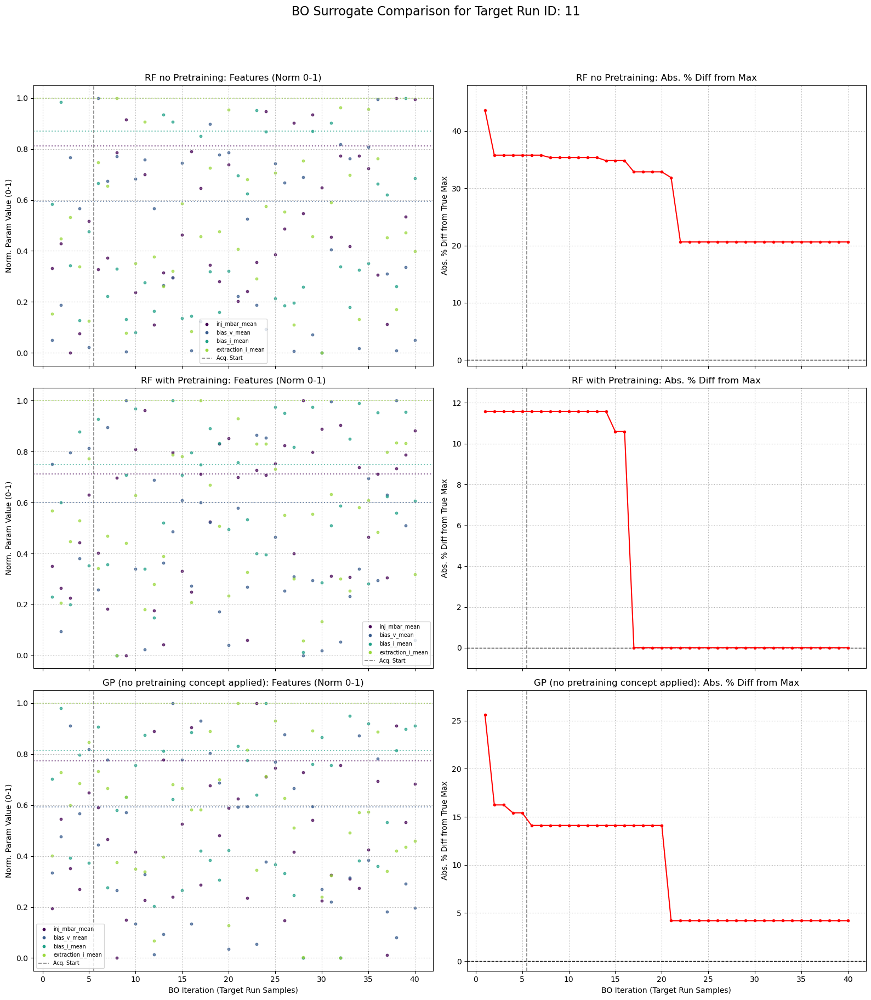


===== SURROGATE COMPARISON FINISHED FOR TARGET RUN ID: 11 =====


In [49]:
TARGET_COL_TO_MAXIMIZE = "fcv1_i_mean" # Your actual target column

PRETRAIN_RUN_IDS_RF = ['00', '09']
TARGET_RUN_ID = "11"
SELECTED_FEATURE_GROUP_NAME = "S"
current_features = get_features(feature_groups[SELECTED_FEATURE_GROUP_NAME])

# Iteration counts
N_INITIAL_RF_NO_PRETRAIN = 5
N_BO_ITER_RF_NO_PRETRAIN = 35

N_INITIAL_RF_WITH_PRETRAIN = 5
N_BO_ITER_RF_WITH_PRETRAIN = 35

N_INITIAL_GP = 5 
N_BO_ITER_GP = 35

# RF specific skopt params and wrapper params
skopt_config_rf = {
    'acq_func': 'EI', 'acq_func_kwargs': {'xi': 0.1}, 'acq_optimizer': 'sampling'
}
rf_config = {
    'n_estimators': 100, 'n_jobs': -1
}

# GP specific skopt params (e.g., different acquisition or optimizer)
skopt_config_gp = {
    'acq_func': 'EI', 'acq_func_kwargs': {'xi': 0.1}, 'acq_optimizer': 'lbfgs' # lbfgs often better for GP
}

if not all(rid in df['run_id'].unique() for rid in PRETRAIN_RUN_IDS_RF + [TARGET_RUN_ID]):
    print(f"Error: One or more specified run_ids not found in DataFrame.")
else:
    res_rf_no_pt, res_rf_w_pt, res_gp = run_surrogate_comparison(
        df=df,
        target_run_id=TARGET_RUN_ID,
        feature_group_cols=current_features,
        target_col=TARGET_COL_TO_MAXIMIZE,
        pretrain_run_ids_for_rf=PRETRAIN_RUN_IDS_RF,
        n_initial_points_rf_no_pretrain=N_INITIAL_RF_NO_PRETRAIN,
        n_bo_iterations_rf_no_pretrain=N_BO_ITER_RF_NO_PRETRAIN,
        n_initial_points_rf_with_pretrain=N_INITIAL_RF_WITH_PRETRAIN,
        n_bo_iterations_rf_with_pretrain=N_BO_ITER_RF_WITH_PRETRAIN,
        n_initial_points_gp=N_INITIAL_GP,
        n_bo_iterations_gp=N_BO_ITER_GP,
        skopt_optimizer_params_rf=skopt_config_rf,
        rf_wrapper_params=rf_config,
        skopt_optimizer_params_gp=skopt_config_gp,
        # gp_kernel_params=gp_kernel_config, # If using custom GP kernel
        random_state_rf_no_pretrain=42,
        random_state_rf_with_pretrain=42, # Keep BO part same for RF comparison
        random_state_gp=123, # Can be different for GP
        plot_comparison=True
    )

In [50]:
    # --- Paste this block right after your run_surrogate_comparison call ---

    print("\n\n" + "="*30 + " EXPERIMENT SUMMARY " + "="*30)
    print(f"Target Run ID: {TARGET_RUN_ID}")
    print(f"Target Column: {TARGET_COL_TO_MAXIMIZE}")
    print(f"Features Used: {current_features}")

    # --- 1. Find and Print Actual Maximum in the Target Run ---
    df_target_run_actual = df[df['run_id'] == TARGET_RUN_ID]
    actual_max_value = np.nan
    actual_max_params = {}

    if not df_target_run_actual.empty and TARGET_COL_TO_MAXIMIZE in df_target_run_actual.columns:
        if not df_target_run_actual[TARGET_COL_TO_MAXIMIZE].isna().all():
            actual_max_idx = df_target_run_actual[TARGET_COL_TO_MAXIMIZE].idxmax()
            actual_max_value = df_target_run_actual.loc[actual_max_idx, TARGET_COL_TO_MAXIMIZE]
            actual_max_params = df_target_run_actual.loc[actual_max_idx, current_features].to_dict()
            print("\n--- Actual Maximum in Target Run ---")
            print(f"  Max Value: {actual_max_value:.6f}")
            print(f"  Parameters at Max:")
            for k, v in actual_max_params.items():
                print(f"    {k}: {v:.6f}")
        else:
            print(f"\nWarning: Target column '{TARGET_COL_TO_MAXIMIZE}' is all NaN for actual run {TARGET_RUN_ID}.")
    else:
        print(f"\nWarning: Could not find data or target column for actual run {TARGET_RUN_ID}.")

    # --- 2. Print Results for Each Method ---
    results_map = {
        "RF No Pretraining": res_rf_no_pt,
        "RF With Pretraining": res_rf_w_pt,
        "GP No Pretraining": res_gp
    }

    for method_name, result_data in results_map.items():
        print(f"\n--- Results for: {method_name} ---")
        if result_data and result_data.get("best_target_value_history"):
            best_val_found_by_method = result_data["best_target_value_history"][-1]
            best_params_found_by_method = result_data["best_params_original_history"][-1]

            print(f"  Best Value Found by BO: {best_val_found_by_method:.6f}")
            if not np.isnan(actual_max_value):
                diff_perc = (abs(actual_max_value - best_val_found_by_method) / abs(actual_max_value) * 100) \
                            if abs(actual_max_value) > 1e-9 else \
                            (abs(actual_max_value - best_val_found_by_method) * 100)
                print(f"  Difference from Actual Max: {abs(actual_max_value - best_val_found_by_method):.6f} ({diff_perc:.4f}%)")

            print(f"  Parameters Found by BO:")
            if best_params_found_by_method:
                for k, v in best_params_found_by_method.items():
                    print(f"    {k}: {v:.6f}")
            else:
                print("    No best parameters recorded.")
            
            # Optional: Print number of iterations/evaluations if stored
            total_evals = len(result_data["best_target_value_history"])
            print(f"  Total evaluations logged for this method (target run): {total_evals}")

        else:
            print("  No results or history available for this method.")
    print("\n" + "="*78)





============================== EXPERIMENT SUMMARY ==============================
Target Run ID: 11
Target Column: fcv1_i_mean
Features Used: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean']

--- Actual Maximum in Target Run ---
  Max Value: 0.000734
  Parameters at Max:
    inj_mbar_mean: 0.000000
    bias_v_mean: 55.722707
    bias_i_mean: 5.252682
    extraction_i_mean: 6.294740

--- Results for: RF No Pretraining ---
  Best Value Found by BO: 0.000583
  Difference from Actual Max: 0.000151 (20.6172%)
  Parameters Found by BO:
    inj_mbar_mean: 0.000000
    bias_v_mean: 50.988800
    bias_i_mean: 4.461260
    extraction_i_mean: 5.343204
  Total evaluations logged for this method (target run): 40

--- Results for: RF With Pretraining ---
  Best Value Found by BO: 0.000734
  Difference from Actual Max: 0.000000 (0.0000%)
  Parameters Found by BO:
    inj_mbar_mean: 0.000000
    bias_v_mean: 55.722707
    bias_i_mean: 5.252682
    extraction_i_mean: 6.294740
  Tot

## Multi-Seed Comparison

In [51]:
 import matplotlib.pyplot as plt

# Plotting style
plt.style.use('seaborn-v0_8-deep')

# --- Ensure RFSurrogateWrapper, get_scaled_data, find_nearest_available_point, ---
# --- run_bo_on_discrete_data, and run_multi_seed_comparison are defined above ---

def plot_multi_seed_comparison_results(
    all_results_rf_no_pretrain,
    all_results_rf_with_pretrain,
    all_results_gp_no_pretrain,
    df_full_dataset,
    target_run_id_for_true_max,
    feature_cols_for_true_max, # Keep for consistency, though not used in this plot version
    target_col_for_true_max
):
    """
    Plots aggregated performance (mean +/- std dev) from multi-seed runs
    with a common y-axis scale and final performance text on each plot.
    Creates a 3x1 plot, each row for one scenario's aggregated performance.
    """
    fig, axs = plt.subplots(3, 1, figsize=(10, 15), sharex=True)
    fig.suptitle(f"Aggregated BO Performance Comparison (Target Run ID: {target_run_id_for_true_max})",
                 fontsize=16, y=1.01)

    # --- Determine True Max for the Target Run (once) ---
    df_target_run = df_full_dataset[df_full_dataset['run_id'] == target_run_id_for_true_max]
    true_max_value = np.nan
    if not df_target_run.empty and target_col_for_true_max in df_target_run.columns:
        if not df_target_run[target_col_for_true_max].isna().all():
            true_max_idx = df_target_run[target_col_for_true_max].idxmax()
            true_max_value = df_target_run.loc[true_max_idx, target_col_for_true_max]
    if pd.isna(true_max_value):
        print(f"Warning: True max for run {target_run_id_for_true_max} could not be determined. Performance plots may be affected.")

    scenarios_data_for_plotting = [
        ("RF No Pretraining", all_results_rf_no_pretrain, axs[0]),
        ("RF With Pretraining", all_results_rf_with_pretrain, axs[1]),
        ("GP No Pretraining", all_results_gp_no_pretrain, axs[2])
    ]

    # --- Determine common Y-axis scale for performance plots ---
    overall_max_perc_diff = 10 # Default max if no data or all perfect
    all_perc_diff_values_for_scaling = []
    if not pd.isna(true_max_value):
        for _, results_list, _ in scenarios_data_for_plotting:
            if results_list and any(res and res.get("best_target_value_history") for res in results_list):
                for res in results_list:
                    if res and res.get("best_target_value_history"):
                        best_target_history = res["best_target_value_history"]
                        denom = abs(true_max_value)
                        for val_found in best_target_history:
                            if pd.isna(val_found): continue
                            diff_absolute_value = abs(true_max_value - val_found)
                            if denom > 1e-9: perc = (diff_absolute_value / denom) * 100
                            elif true_max_value == 0 and val_found == 0: perc = 0.0
                            elif true_max_value == 0 and val_found != 0: perc = 100.0
                            else: perc = diff_absolute_value * 100
                            all_perc_diff_values_for_scaling.append(perc)
    if all_perc_diff_values_for_scaling:
        overall_max_perc_diff = max(10, np.nanmax(all_perc_diff_values_for_scaling) * 1.1)
    common_y_lim_perf = (-5, overall_max_perc_diff)

    # --- Plotting Loop ---
    for scenario_name, results_list, ax_perf in scenarios_data_for_plotting:
        ax_perf.set_title(f"{scenario_name}: Aggregated Abs. % Diff from Max")
        ax_perf.set_ylabel("Abs. % Diff from True Max")
        ax_perf.grid(True, linestyle=':')
        ax_perf.axhline(0, color='black', linestyle='--', linewidth=1.0)
        ax_perf.set_ylim(common_y_lim_perf)

        if not results_list or all(res is None or not res.get("best_target_value_history") for res in results_list):
            ax_perf.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax_perf.transAxes)
            continue

        all_perf_histories_for_scenario = []
        min_len_scenario = np.inf
        final_perf_values_for_scenario = [] # To store the last value of each run's history

        for res_idx, res in enumerate(results_list):
            if res and res.get("best_target_value_history") and res["best_target_value_history"]: # Check history is not empty
                best_target_history = res["best_target_value_history"]
                current_perc_diffs = []
                if pd.isna(true_max_value):
                    current_perc_diffs = [np.nan] * len(best_target_history)
                else:
                    denom = abs(true_max_value)
                    for val_found in best_target_history:
                        if pd.isna(val_found): current_perc_diffs.append(np.nan); continue
                        diff_absolute_value = abs(true_max_value - val_found)
                        if denom > 1e-9: perc = (diff_absolute_value / denom) * 100
                        elif true_max_value == 0 and val_found == 0: perc = 0.0
                        elif true_max_value == 0 and val_found != 0: perc = 100.0
                        else: perc = diff_absolute_value * 100
                        current_perc_diffs.append(perc)
                
                if current_perc_diffs: # If list is not empty
                    all_perf_histories_for_scenario.append(current_perc_diffs)
                    min_len_scenario = min(min_len_scenario, len(current_perc_diffs))
                    final_perf_values_for_scenario.append(current_perc_diffs[-1]) # Store last value

        if not all_perf_histories_for_scenario or min_len_scenario == np.inf:
            ax_perf.text(0.5, 0.5, "No valid perf data", ha='center', va='center', transform=ax_perf.transAxes)
            continue
            
        truncated_histories_scenario = [hist[:int(min_len_scenario)] for hist in all_perf_histories_for_scenario if len(hist) >= min_len_scenario]
        if not truncated_histories_scenario:
            ax_perf.text(0.5, 0.5, "No common length", ha='center', va='center', transform=ax_perf.transAxes)
            continue

        stacked_histories_scenario = np.array(truncated_histories_scenario)
        mean_perf_scenario = np.nanmean(stacked_histories_scenario, axis=0)
        std_perf_scenario = np.nanstd(stacked_histories_scenario, axis=0)
        iterations_axis_scenario = np.arange(1, len(mean_perf_scenario) + 1)

        ax_perf.plot(iterations_axis_scenario, mean_perf_scenario, marker='.', linestyle='-', color='red', label=f"Mean")
        ax_perf.fill_between(iterations_axis_scenario, 
                             np.maximum(common_y_lim_perf[0], mean_perf_scenario - std_perf_scenario), # Clip to y_lim
                             np.minimum(common_y_lim_perf[1], mean_perf_scenario + std_perf_scenario), # Clip to y_lim
                             color='red', alpha=0.2, label=f"+/- 1 std dev")
        
        initial_points_count_for_scenario = 0
        first_valid_res = next((res for res in results_list if res and res.get("n_initial_points_target_run_actual")), None)
        if first_valid_res:
            initial_points_count_for_scenario = first_valid_res["n_initial_points_target_run_actual"]

        if initial_points_count_for_scenario > 0 and initial_points_count_for_scenario < len(mean_perf_scenario):
            ax_perf.axvline(initial_points_count_for_scenario + 0.5, color='grey', linestyle='--', linewidth=1.2, label='Acq. Start')

        # --- Add text for final performance ---
        if final_perf_values_for_scenario:
            mean_final_perf = np.nanmean(final_perf_values_for_scenario)
            std_final_perf = np.nanstd(final_perf_values_for_scenario)
            if not (np.isnan(mean_final_perf) or np.isnan(std_final_perf)):
                final_perf_text = f"Final: {mean_final_perf:.2f}% \u00B1 {std_final_perf:.2f}%"
                # Position the text. Adjust x, y, ha, va as needed.
                # Using transform=ax_perf.transAxes for positioning relative to axes (0,0 to 1,1)
                ax_perf.text(0.95, 0.95, final_perf_text,
                             transform=ax_perf.transAxes,
                             fontsize=9, color='blue',
                             ha='left', va='top',
                             bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7))
        
        ax_perf.legend(fontsize='small', loc='best')


    axs[-1].set_xlabel("BO Iteration (Target Run Samples)")

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

    # Print aggregated final performance (this part can remain as it was)
    print("\n--- Aggregated Final Performance (Mean +/- Std Dev of Abs. % Diff from True Max) ---")
    for scenario_name, results_list, _ in scenarios_data_for_plotting:
        final_perfs = []
        for res in results_list:
            if res and res.get("best_target_value_history") and res["best_target_value_history"]:
                val_found = res["best_target_value_history"][-1]
                if pd.isna(true_max_value) or pd.isna(val_found): final_perfs.append(np.nan); continue
                diff_absolute_value = abs(true_max_value - val_found)
                denom = abs(true_max_value)
                if denom > 1e-9: perc = (diff_absolute_value / denom) * 100
                elif true_max_value == 0 and val_found == 0: perc = 0.0
                elif true_max_value == 0 and val_found != 0: perc = 100.0
                else: perc = diff_absolute_value * 100
                final_perfs.append(perc)
        if final_perfs:
            mean_final_perf = np.nanmean(final_perfs)
            std_final_perf = np.nanstd(final_perfs)
            print(f"  {scenario_name}: {mean_final_perf:.2f}% +/- {std_final_perf:.2f}%")
        else:
            print(f"  {scenario_name}: No valid final performance data.")


In [52]:
import matplotlib.pyplot as plt

# Plotting style
plt.style.use('seaborn-v0_8-deep')

# --- Ensure RFSurrogateWrapper, get_scaled_data, find_nearest_available_point, ---
# --- run_bo_on_discrete_data, run_surrogate_comparison (or its logic), ---
# --- and plot_surrogate_comparison_results (or a new aggregated one) ARE DEFINED ---

def run_multi_seed_comparison(
    df,
    target_run_id,
    feature_group_cols,
    target_col,
    pretrain_run_ids_for_rf,
    # Iteration counts (assuming same for all runs within a scenario for aggregation)
    n_initial_points_rf_no_pretrain, n_bo_iterations_rf_no_pretrain,
    n_initial_points_rf_with_pretrain, n_bo_iterations_rf_with_pretrain,
    n_initial_points_gp, n_bo_iterations_gp,
    # Shared params
    skopt_optimizer_params_rf=None, rf_wrapper_params=None,
    skopt_optimizer_params_gp=None, gp_kernel_params=None,
    n_seeds=5, # Number of different random seeds to run
    base_random_seed=42, # Starting seed, will be incremented
    plot_aggregated_results=True
):
    """
    Runs the surrogate comparison (RF no pretrain, RF with pretrain, GP no pretrain)
    multiple times with different random seeds and collects results for aggregation.
    """
    print(f"===== STARTING MULTI-SEED SURROGATE COMPARISON (N_SEEDS={n_seeds}) =====")
    print(f"Target Run ID: {target_run_id}, Target Column: {target_col}")

    all_results_rf_no_pretrain = []
    all_results_rf_with_pretrain = []
    all_results_gp_no_pretrain = []

    for i in range(n_seeds):
        current_seed = base_random_seed + i
        print(f"\n--- Running Seed {i+1}/{n_seeds} (Actual Seed: {current_seed}) ---")

        # Using the existing run_surrogate_comparison logic internally
        # Or you can call run_bo_on_discrete_data three times directly here
        # to have finer control over seeds for each part if needed.
        # For simplicity, we'll assume run_surrogate_comparison handles
        # passing down distinct random_state arguments.

        # We need to ensure each of the three BO runs within run_surrogate_comparison
        # gets a seed derived from current_seed.
        # Let's modify how seeds are passed to run_surrogate_comparison or
        # call run_bo_on_discrete_data directly.
        # Calling run_bo_on_discrete_data directly is cleaner for seed management here.

        # --- RF No Pretraining for current seed ---
        print(f"  Running RF No Pretraining (Seed: {current_seed})...")
        res_rf_np = run_bo_on_discrete_data(
            df=df, target_run_id=target_run_id, feature_group_cols=feature_group_cols, target_col=target_col,
            base_estimator_type="RF", pretrain_run_ids=[],
            n_initial_points_target_run=n_initial_points_rf_no_pretrain,
            n_bo_iterations=n_bo_iterations_rf_no_pretrain,
            skopt_optimizer_params=skopt_optimizer_params_rf,
            rf_wrapper_params=rf_wrapper_params,
            random_state=current_seed # Use current_seed
        )
        all_results_rf_no_pretrain.append(res_rf_np)

        # --- RF With Pretraining for current seed ---
        print(f"  Running RF With Pretraining (Seed: {current_seed + n_seeds})...") # Offset seed
        res_rf_wp = run_bo_on_discrete_data(
            df=df, target_run_id=target_run_id, feature_group_cols=feature_group_cols, target_col=target_col,
            base_estimator_type="RF", pretrain_run_ids=pretrain_run_ids_for_rf,
            n_initial_points_target_run=n_initial_points_rf_with_pretrain,
            n_bo_iterations=n_bo_iterations_rf_with_pretrain,
            skopt_optimizer_params=skopt_optimizer_params_rf,
            rf_wrapper_params=rf_wrapper_params,
            random_state=current_seed + n_seeds # Ensure distinct seed for this part
        )
        all_results_rf_with_pretrain.append(res_rf_wp)

        # --- GP No Pretraining for current seed ---
        print(f"  Running GP No Pretraining (Seed: {current_seed + 2*n_seeds})...") # Further offset seed
        skopt_gp_final_params = skopt_optimizer_params_gp if skopt_optimizer_params_gp is not None else \
                                (skopt_optimizer_params_rf if skopt_optimizer_params_rf is not None else {})
        if 'acq_optimizer' not in skopt_gp_final_params: # Default for GP
            skopt_gp_final_params['acq_optimizer'] = 'lbfgs'

        res_gp = run_bo_on_discrete_data(
            df=df, target_run_id=target_run_id, feature_group_cols=feature_group_cols, target_col=target_col,
            base_estimator_type="GP", pretrain_run_ids=[],
            n_initial_points_target_run=n_initial_points_gp,
            n_bo_iterations=n_bo_iterations_gp,
            skopt_optimizer_params=skopt_gp_final_params,
            gp_kernel_params=gp_kernel_params,
            random_state=current_seed + 2*n_seeds # Ensure distinct seed
        )
        all_results_gp_no_pretrain.append(res_gp)

    if plot_aggregated_results:
        plot_multi_seed_comparison_results(
            all_results_rf_no_pretrain,
            all_results_rf_with_pretrain,
            all_results_gp_no_pretrain,
            df_full_dataset=df,
            target_run_id_for_true_max=target_run_id,
            feature_cols_for_true_max=feature_group_cols,
            target_col_for_true_max=target_col
        )

    print(f"\n===== MULTI-SEED SURROGATE COMPARISON FINISHED =====")
    return all_results_rf_no_pretrain, all_results_rf_with_pretrain, all_results_gp_no_pretrain


===== STARTING MULTI-SEED SURROGATE COMPARISON (N_SEEDS=5) =====
Target Run ID: 14, Target Column: fcv1_i_mean

--- Running Seed 1/5 (Actual Seed: 420) ---
  Running RF No Pretraining (Seed: 420)...
--- Starting BO for Target Run ID: 14 (Surrogate: RF no Pretraining) ---
Features: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean']
Target: fcv1_i_mean
Telling optimizer with 10 initial points from target run...
Starting BO loop for 30 iterations...
--- BO Finished (RF) ---
Best target value found: 0.0007
Best parameters (original features): {'inj_mbar_mean': 1.092820666666667e-07, 'bias_v_mean': 48.79910000000004, 'bias_i_mean': 15.466068333333318, 'extraction_i_mean': 9.45427733333333}
  Running RF With Pretraining (Seed: 425)...
--- Starting BO for Target Run ID: 14 (Surrogate: RF with Pretraining) ---
Features: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean']
Target: fcv1_i_mean
Pretraining with Run IDs: ['00']
Telling optimizer with 2549 pretrain

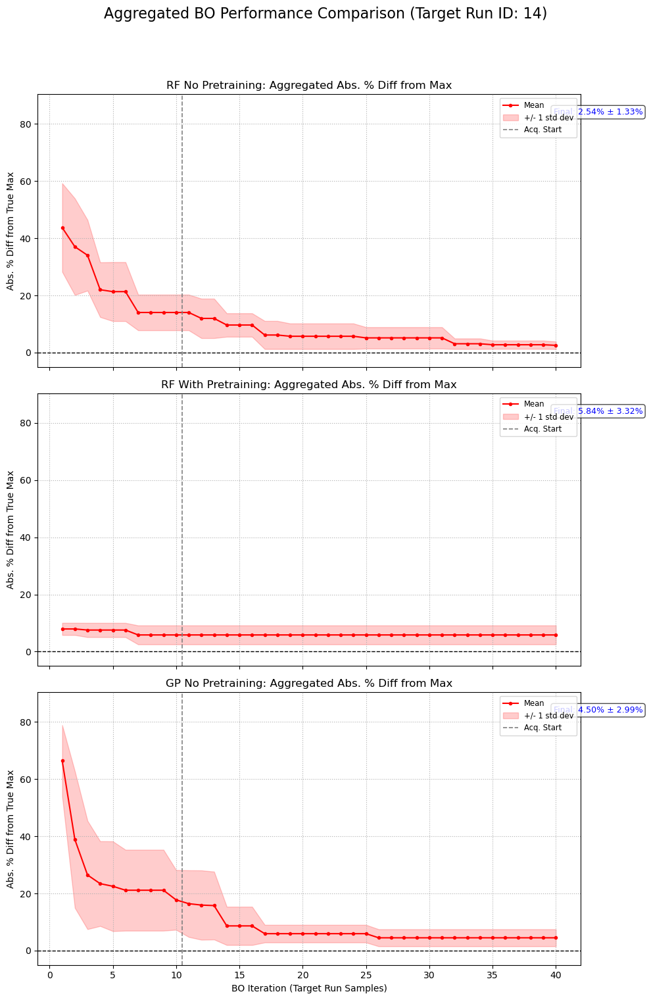


--- Aggregated Final Performance (Mean +/- Std Dev of Abs. % Diff from True Max) ---
  RF No Pretraining: 2.54% +/- 1.33%
  RF With Pretraining: 5.84% +/- 3.32%
  GP No Pretraining: 4.50% +/- 2.99%

===== MULTI-SEED SURROGATE COMPARISON FINISHED =====


In [57]:
# --- ASSUME df, feature_groups, RFSurrogateWrapper, get_scaled_data, ---
# --- find_nearest_available_point, and the updated run_bo_on_discrete_data ARE DEFINED ---

TARGET_COL_TO_MAXIMIZE = "fcv1_i_mean"
PRETRAIN_RUN_IDS_RF = ["00"]
TARGET_RUN_ID = "14"
SELECTED_FEATURE_GROUP_NAME = "S"
current_features = get_features(feature_groups[SELECTED_FEATURE_GROUP_NAME])

# Iteration counts (should be consistent for aggregation)
N_INITIAL_RF_NO_PRETRAIN = 10; N_BO_ITER_RF_NO_PRETRAIN = 30
N_INITIAL_RF_WITH_PRETRAIN = 10;  N_BO_ITER_RF_WITH_PRETRAIN = 30 # Total target samples = 30
N_INITIAL_GP = 10;               N_BO_ITER_GP = 30

# Shared BO and RF parameters
skopt_config_rf = {'acq_func': 'EI', 'acq_func_kwargs': {'xi': 0.05}, 'acq_optimizer': 'sampling'}
rf_config = {'n_estimators': 100, 'min_samples_leaf': 3, 'n_jobs': -1}
skopt_config_gp = {'acq_func': 'EI', 'acq_func_kwargs': {'xi': 0.01}, 'acq_optimizer': 'lbfgs'}

N_SEEDS_TO_RUN = 5 # Number of seeds for the multi-run experiment
BASE_SEED = 420    # Starting seed

if not all(rid in df['run_id'].unique() for rid in PRETRAIN_RUN_IDS_RF + [TARGET_RUN_ID]):
    print(f"Error: One or more specified run_ids not found in DataFrame.")
else:
    # Call the new multi-seed comparison function
    all_rf_np, all_rf_wp, all_gp = run_multi_seed_comparison(
        df=df,
        target_run_id=TARGET_RUN_ID,
        feature_group_cols=current_features,
        target_col=TARGET_COL_TO_MAXIMIZE,
        pretrain_run_ids_for_rf=PRETRAIN_RUN_IDS_RF,
        n_initial_points_rf_no_pretrain=N_INITIAL_RF_NO_PRETRAIN,
        n_bo_iterations_rf_no_pretrain=N_BO_ITER_RF_NO_PRETRAIN,
        n_initial_points_rf_with_pretrain=N_INITIAL_RF_WITH_PRETRAIN,
        n_bo_iterations_rf_with_pretrain=N_BO_ITER_RF_WITH_PRETRAIN,
        n_initial_points_gp=N_INITIAL_GP,
        n_bo_iterations_gp=N_BO_ITER_GP,
        skopt_optimizer_params_rf=skopt_config_rf,
        rf_wrapper_params=rf_config,
        skopt_optimizer_params_gp=skopt_config_gp,
        n_seeds=N_SEEDS_TO_RUN,
        base_random_seed=BASE_SEED,
        plot_aggregated_results=True
    )
    # The plotting is now handled inside run_multi_seed_comparison
    # You can add further analysis of the returned lists of results here if needed


## Run pairing

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns # For heatmaps
import os
import re
import math
import time
from tqdm.notebook import tqdm

# Scikit-learn
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.exceptions import NotFittedError
from sklearn.metrics.pairwise import euclidean_distances

# Scikit-optimize
from skopt import Optimizer
from skopt.space import Real

# Plotting style
plt.style.use('seaborn-v0_8-deep')

# --- Ensure RFSurrogateWrapper, get_scaled_data, find_nearest_available_point, ---
# --- and run_bo_on_discrete_data are defined above in your notebook ---

def evaluate_pretrain_target_pairs(
    df,
    run_ids_to_test, # List of unique run_ids to form pairs from
    feature_group_cols,
    target_col,
    # Iteration counts (consistent for all pairs for fair comparison)
    n_initial_points,
    n_bo_iterations,
    # Shared params
    skopt_optimizer_params=None,
    rf_wrapper_params=None,
    n_seeds_per_pair=3,
    base_random_seed=42,
    plot_heatmap=True,
    plot_bar_charts=True
):
    """
    Evaluates BO performance for various pretrain-target run_id pairs.
    Each pair uses one run_id for pretraining and a different one for target.
    Also includes a "no pretraining" baseline for each target run.
    """
    if len(run_ids_to_test) < 2:
        print("Need at least 2 run_ids to test pretrain-target pairs.")
        return None

    print(f"===== EVALUATING PRETRAIN-TARGET PAIRS ({len(run_ids_to_test)} runs) =====")
    print(f"Features: {feature_group_cols}, Target: {target_col}")
    print(f"Seeds per pair: {n_seeds_per_pair}")

    # Store results: (pretrain_run_id, target_run_id) -> list of final performances over seeds
    performance_matrix_data = {} # For heatmap: key=(pretrain_id, target_id), val=mean_final_perf
    all_run_results_detailed = {} # Optional: For storing full results if needed later

    # --- Determine True Max for each potential target run (once) ---
    true_max_values_per_target_run = {}
    for r_id in run_ids_to_test:
        df_target_run = df[df['run_id'] == r_id]
        true_max_val = np.nan
        if not df_target_run.empty and target_col in df_target_run.columns:
            if not df_target_run[target_col].isna().all():
                true_max_idx = df_target_run[target_col].idxmax()
                true_max_val = df_target_run.loc[true_max_idx, target_col]
        true_max_values_per_target_run[r_id] = true_max_val


    # --- Iterate through each run_id as a target ---
    for target_idx, target_run_id in enumerate(run_ids_to_test):
        print(f"\n--- Target Run ID: {target_run_id} ---")
        
        # Baseline: No Pretraining for this target_run_id
        print(f"  Running 'No Pretraining' baseline for target {target_run_id}...")
        no_pretrain_final_perfs = []
        for seed_iter in range(n_seeds_per_pair):
            current_seed = base_random_seed + target_idx * 1000 + seed_iter # Ensure unique seeds
            results = run_bo_on_discrete_data(
                df=df, target_run_id=target_run_id, feature_group_cols=feature_group_cols, target_col=target_col,
                base_estimator_type="RF", pretrain_run_ids=[],
                n_initial_points_target_run=n_initial_points, n_bo_iterations=n_bo_iterations,
                skopt_optimizer_params=skopt_optimizer_params, rf_wrapper_params=rf_wrapper_params,
                random_state=current_seed
            )
            if results and results.get("best_target_value_history") and results["best_target_value_history"]:
                val_found = results["best_target_value_history"][-1]
                true_max_for_this_target = true_max_values_per_target_run.get(target_run_id, np.nan)
                if pd.isna(true_max_for_this_target) or pd.isna(val_found):
                    no_pretrain_final_perfs.append(np.nan)
                else:
                    diff_abs = abs(true_max_for_this_target - val_found)
                    denom = abs(true_max_for_this_target)
                    if denom > 1e-9: perc = (diff_abs / denom) * 100
                    elif true_max_for_this_target == 0 and val_found == 0: perc = 0.0
                    else: perc = 100.0 # Indicate large diff if true_max is 0 and found is not
                    no_pretrain_final_perfs.append(perc)
            else:
                no_pretrain_final_perfs.append(np.nan) # Or some high penalty value

        performance_matrix_data[("No Pretrain", target_run_id)] = np.nanmean(no_pretrain_final_perfs)
        all_run_results_detailed[("No Pretrain", target_run_id)] = no_pretrain_final_perfs # Store raw seed results


        # Iterate through each *other* run_id as a pretraining source
        for pretrain_idx, pretrain_run_id in enumerate(run_ids_to_test):
            if pretrain_run_id == target_run_id:
                continue # Skip pretraining on itself for this specific experiment design

            print(f"  Pretraining with: {pretrain_run_id}, Targeting: {target_run_id}...")
            pair_final_perfs = []
            for seed_iter in range(n_seeds_per_pair):
                # Ensure unique seeds for each pair and seed iteration
                current_seed = base_random_seed + target_idx * 1000 + pretrain_idx * 100 + seed_iter
                results = run_bo_on_discrete_data(
                    df=df, target_run_id=target_run_id, feature_group_cols=feature_group_cols, target_col=target_col,
                    base_estimator_type="RF", pretrain_run_ids=[pretrain_run_id], # Single pretrain run
                    n_initial_points_target_run=n_initial_points, n_bo_iterations=n_bo_iterations,
                    skopt_optimizer_params=skopt_optimizer_params, rf_wrapper_params=rf_wrapper_params,
                    random_state=current_seed
                )
                if results and results.get("best_target_value_history") and results["best_target_value_history"]:
                    val_found = results["best_target_value_history"][-1]
                    true_max_for_this_target = true_max_values_per_target_run.get(target_run_id, np.nan)
                    if pd.isna(true_max_for_this_target) or pd.isna(val_found):
                        pair_final_perfs.append(np.nan)
                    else:
                        diff_abs = abs(true_max_for_this_target - val_found)
                        denom = abs(true_max_for_this_target)
                        if denom > 1e-9: perc = (diff_abs / denom) * 100
                        elif true_max_for_this_target == 0 and val_found == 0: perc = 0.0
                        else: perc = 100.0
                        pair_final_perfs.append(perc)
                else:
                    pair_final_perfs.append(np.nan) # Or a high penalty

            performance_matrix_data[(pretrain_run_id, target_run_id)] = np.nanmean(pair_final_perfs)
            all_run_results_detailed[(pretrain_run_id, target_run_id)] = pair_final_perfs


    # --- Convert performance_matrix_data to DataFrame for heatmap ---
    # Rows: target_run_id, Columns: pretrain_run_id (and "No Pretrain")
    # Sort for consistent plotting
    sorted_target_ids = sorted(run_ids_to_test)
    sorted_pretrain_ids_with_none = ["No Pretrain"] + sorted(run_ids_to_test)

    heatmap_df = pd.DataFrame(index=sorted_target_ids, columns=sorted_pretrain_ids_with_none, dtype=float)
    for (p_id, t_id), avg_perf in performance_matrix_data.items():
        if t_id in heatmap_df.index and p_id in heatmap_df.columns:
            heatmap_df.loc[t_id, p_id] = avg_perf
    
    # Fill diagonal for pretrain_id == target_id with NaN or a specific marker if desired
    # In our setup, this combination was skipped, so it will be NaN by default.
    # We could fill it with the "No Pretrain" value for that target for completeness in the square matrix part.
    for r_id in sorted_target_ids:
        if pd.isna(heatmap_df.loc[r_id, r_id]): # If it was skipped
             heatmap_df.loc[r_id, r_id] = heatmap_df.loc[r_id, "No Pretrain"]


    if plot_heatmap:
        plt.figure(figsize=(max(8, len(sorted_pretrain_ids_with_none)), max(6, len(sorted_target_ids))))
        sns.heatmap(heatmap_df, annot=True, fmt=".1f", cmap="viridis_r", # _r reverses viridis (lower is better)
                    linewidths=.5, cbar_kws={'label': 'Avg. Abs. % Diff from True Max'})
        plt.title("BO Performance: Pretrain Run vs. Target Run")
        plt.xlabel("Pretraining Run ID ('No Pretrain' = Baseline)")
        plt.ylabel("Target Run ID")
        plt.xticks(rotation=45, ha="right")
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

    if plot_bar_charts:
        # Bar chart 1: For each TARGET run, which PRETRAIN run was best?
        n_targets = len(sorted_target_ids)
        fig_bar1, axs_bar1 = plt.subplots(math.ceil(n_targets / 2), 2, figsize=(15, 5 * math.ceil(n_targets / 2)), sharey=True)
        axs_bar1 = axs_bar1.flatten()
        fig_bar1.suptitle("Best Pretraining Source for Each Target Run (Lower % Diff is Better)", fontsize=16, y=1.02)

        for i, t_id in enumerate(sorted_target_ids):
            if i < len(axs_bar1):
                ax = axs_bar1[i]
                # Select columns that are actual pretrain runs (exclude "No Pretrain" if it's an index)
                # and also exclude pretraining on itself for this specific view
                relevant_pretrain_cols = [p_col for p_col in sorted_pretrain_ids_with_none if p_col != t_id] # or p_col != "No Pretrain"
                
                data_for_target = heatmap_df.loc[t_id, relevant_pretrain_cols].sort_values(ascending=True)
                data_for_target.plot(kind='bar', ax=ax, colormap='viridis')
                ax.set_title(f"Target: {t_id}")
                ax.set_ylabel("Avg. Abs. % Diff")
                ax.tick_params(axis='x', rotation=45)
        plt.tight_layout(rect=[0,0,1,0.97])
        plt.show()

        # Bar chart 2: For each PRETRAIN run, how well did it generalize to TARGETS?
        actual_pretrain_ids = sorted([p_id for p_id in sorted_pretrain_ids_with_none if p_id != "No Pretrain"])
        n_pretrain_sources = len(actual_pretrain_ids)
        fig_bar2, axs_bar2 = plt.subplots(math.ceil(n_pretrain_sources / 2), 2, figsize=(15, 5 * math.ceil(n_pretrain_sources / 2)), sharey=True)
        axs_bar2 = axs_bar2.flatten()
        fig_bar2.suptitle("Effectiveness of Each Pretraining Source Across Targets (Lower % Diff is Better)", fontsize=16, y=1.02)

        for i, p_id in enumerate(actual_pretrain_ids):
            if i < len(axs_bar2):
                ax = axs_bar2[i]
                # Select rows that are actual target runs and exclude targeting itself
                relevant_target_rows = [t_row for t_row in sorted_target_ids if t_row != p_id]
                if not relevant_target_rows: continue # Skip if no relevant targets

                data_for_pretrain = heatmap_df.loc[relevant_target_rows, p_id].sort_values(ascending=True)
                data_for_pretrain.plot(kind='bar', ax=ax, colormap='viridis')
                ax.set_title(f"Pretrained on: {p_id}")
                ax.set_ylabel("Avg. Abs. % Diff")
                ax.tick_params(axis='x', rotation=45)
        plt.tight_layout(rect=[0,0,1,0.97])
        plt.show()


    print(f"\n===== PRETRAIN-TARGET PAIR EVALUATION FINISHED =====")
    return heatmap_df, all_run_results_detailed # Return heatmap data and raw results


===== EVALUATING PRETRAIN-TARGET PAIRS (7 runs) =====
Features: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean'], Target: fcv1_i_mean
Seeds per pair: 500

--- Target Run ID: 00 ---
  Running 'No Pretraining' baseline for target 00...
--- Starting BO for Target Run ID: 00 (Surrogate: RF no Pretraining) ---
Features: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean']
Target: fcv1_i_mean
Telling optimizer with 5 initial points from target run...
Starting BO loop for 25 iterations...
--- BO Finished (RF) ---
Best target value found: 0.0006
Best parameters (original features): {'inj_mbar_mean': 1.446244499999999e-07, 'bias_v_mean': 54.59141333333331, 'bias_i_mean': 8.464244833333334, 'extraction_i_mean': 5.835121166666667}
--- Starting BO for Target Run ID: 00 (Surrogate: RF no Pretraining) ---
Features: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean']
Target: fcv1_i_mean
Telling optimizer with 5 initial points from target run...
Sta

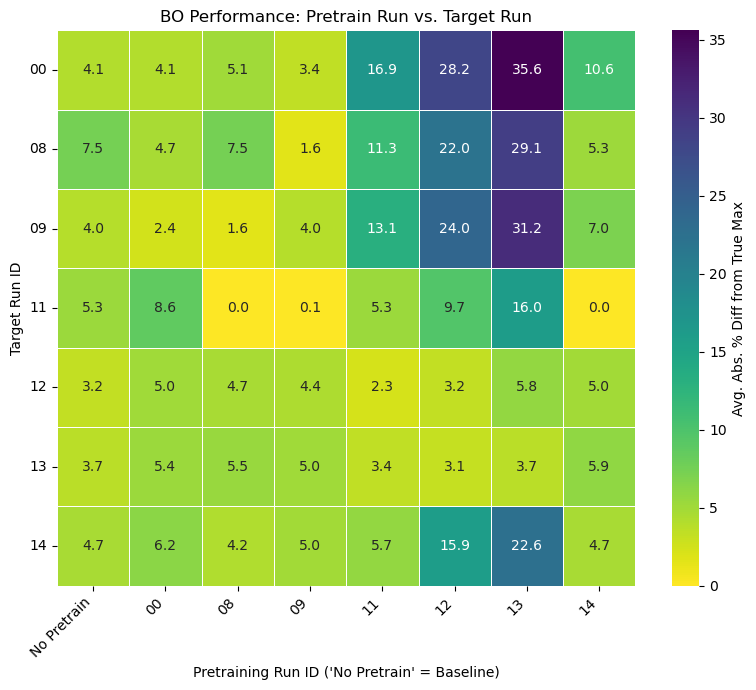

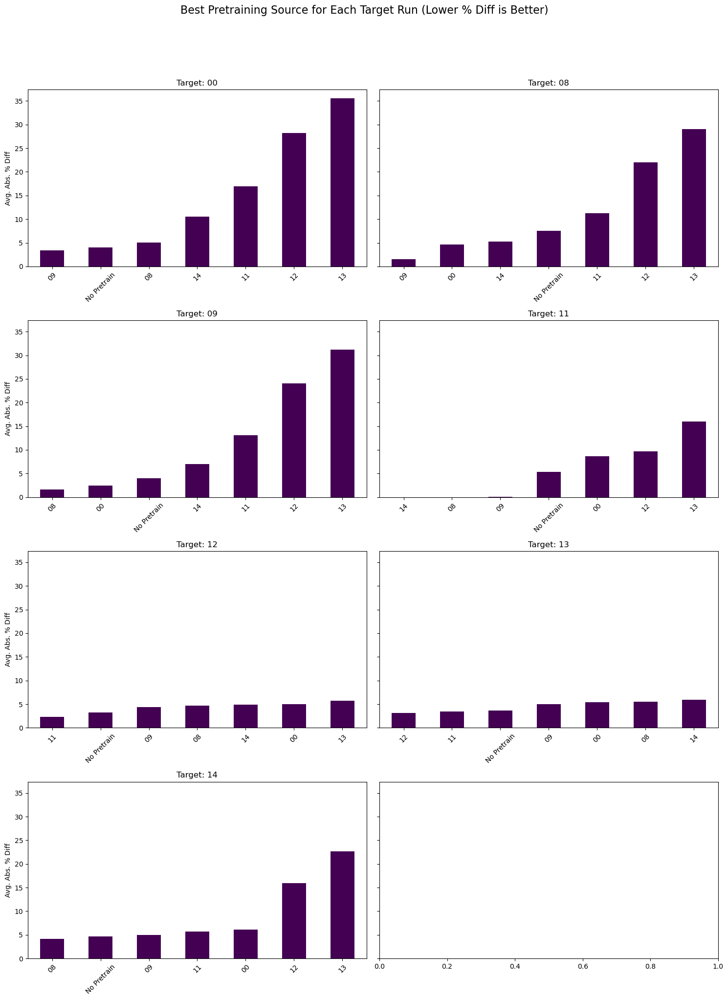

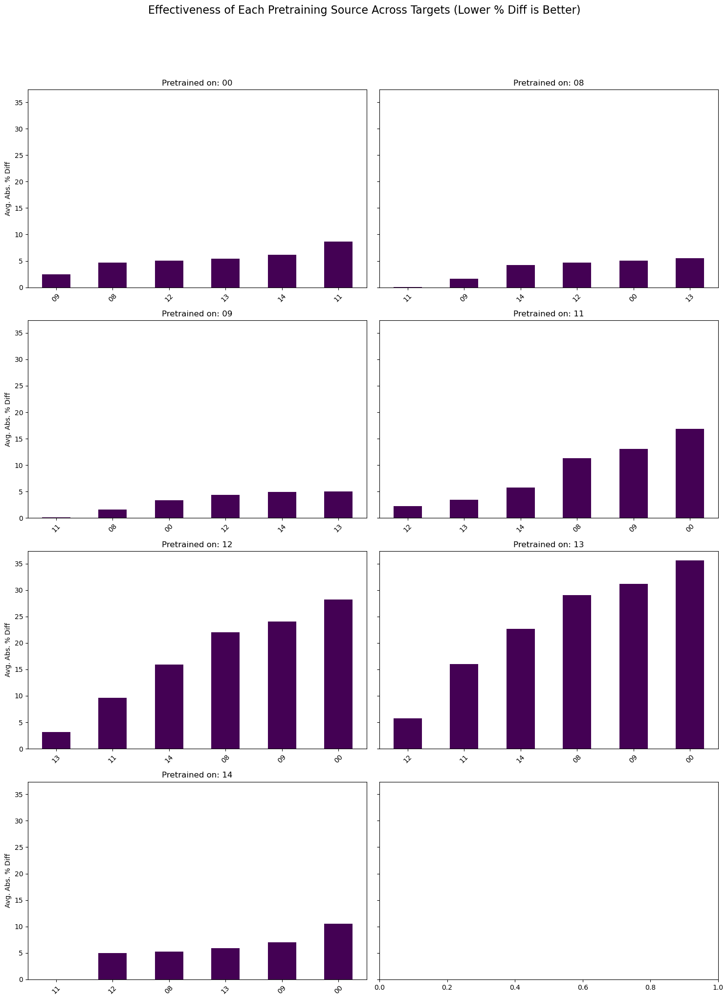


===== PRETRAIN-TARGET PAIR EVALUATION FINISHED =====

--- Heatmap Data ---
    No Pretrain        00        08        09         11         12  \
00     4.064745  4.064745  5.053677  3.365435  16.898988  28.186635   
08     7.504982  4.692463  7.504982  1.599142  11.275485  22.020132   
09     4.003673  2.419042  1.633275  4.003673  13.092919  24.013056   
11     5.328181  8.633156  0.012982  0.084539   5.328181   9.655898   
12     3.203008  5.021610  4.707569  4.385596   2.280819   3.203008   
13     3.673694  5.379779  5.485179  5.044662   3.445277   3.136980   
14     4.706067  6.168650  4.183328  4.974714   5.721713  15.930094   

           13         14  
00  35.602551  10.572355  
08  29.079300   5.253199  
09  31.187520   6.972273  
11  15.999765   0.000000  
12   5.785249   4.952927  
13   3.673694   5.899249  
14  22.636938   4.706067  


In [69]:
# --- ASSUME df, feature_groups, RFSurrogateWrapper, get_scaled_data, ---
# --- find_nearest_available_point, and run_bo_on_discrete_data ARE DEFINED ---

TARGET_COL_TO_MAXIMIZE = "fcv1_i_mean" # Your actual target column
SELECTED_FEATURE_GROUP_NAME = "S"     # Or "M", "L"
current_features = get_features(feature_groups[SELECTED_FEATURE_GROUP_NAME])

# List of run_ids you want to include in the pair-wise comparison
# For example, if you have runs "00", "01", "02", "03", "08", "09"
RUN_IDS_FOR_PAIR_TEST = ["00", "08", "09", "11", "12", "13", "14"] # Ensure these exist in df

# Iteration counts - keep these consistent for fair comparison across pairs
N_INITIAL = 5  # Initial points from target run for each BO
N_BO_ITER = 25 # Active BO iterations for each pair

# Shared BO and RF parameters
skopt_config = {
    'acq_func': 'EI',
    'acq_func_kwargs': {'xi': 0.05},
    'acq_optimizer': 'sampling'
}
rf_config = {
    'n_estimators': 100,
    'min_samples_leaf': 3,
    'n_jobs': -1
}

N_SEEDS_PER_PAIR_RUN = 500 # Number of seeds for each (pretrain, target) combination
BASE_SEED_FOR_PAIRS = 777

if len(set(RUN_IDS_FOR_PAIR_TEST).intersection(set(df['run_id'].unique()))) != len(RUN_IDS_FOR_PAIR_TEST):
    print(f"Error: Not all run_ids in RUN_IDS_FOR_PAIR_TEST exist in the DataFrame.")
    print(f"Available in df: {df['run_id'].unique()}")
    print(f"Requested for test: {RUN_IDS_FOR_PAIR_TEST}")
else:
    heatmap_data, raw_pair_results = evaluate_pretrain_target_pairs(
        df=df,
        run_ids_to_test=RUN_IDS_FOR_PAIR_TEST,
        feature_group_cols=current_features,
        target_col=TARGET_COL_TO_MAXIMIZE,
        n_initial_points=N_INITIAL,
        n_bo_iterations=N_BO_ITER,
        skopt_optimizer_params=skopt_config,
        rf_wrapper_params=rf_config,
        n_seeds_per_pair=N_SEEDS_PER_PAIR_RUN,
        base_random_seed=BASE_SEED_FOR_PAIRS,
        plot_heatmap=True,
        plot_bar_charts=True
    )

    # You can further analyze heatmap_data (Pandas DataFrame)
    if heatmap_data is not None:
        print("\n--- Heatmap Data ---")
        print(heatmap_data)


## Testing best pretraining set

In [83]:
# --- Ensure RFSurrogateWrapper, get_scaled_data, find_nearest_available_point, ---
# --- and run_bo_on_discrete_data are defined above ---

def plot_fixed_pretrain_target_performance_2col(
    all_target_comparison_results, # Dict: target_run_id -> {'with_pretrain': [sr], 'no_pretrain': [sr]}
    true_max_values_per_target_run, # Dict: target_run_id -> true_max_value
    confidence_level=0.95
):
    """
    Plots aggregated performance for each target run in a 2-column layout:
    Left column: With Pretraining
    Right column: No Pretraining
    """
    num_targets = len(all_target_comparison_results)
    if num_targets == 0:
        print("No target results to plot.")
        return

    fig, axs = plt.subplots(num_targets, 2, figsize=(16, 6 * num_targets), sharex=True)
    if num_targets == 1: # Ensure axs is 2D for consistent indexing
        axs = np.array([axs])

    # Get the label for the "with pretraining" scenario from the first target's results
    # Assuming all targets have the same pretraining setup for the "with_pretrain" key
    first_target_key = list(all_target_comparison_results.keys())[0]
    pretrain_label_with = all_target_comparison_results[first_target_key].get("with_pretrain_label", "With Pretraining")
    pretrain_label_without = all_target_comparison_results[first_target_key].get("no_pretrain_label", "No Pretraining")

    fig.suptitle(f"BO Performance Comparison: '{pretrain_label_with}' vs. '{pretrain_label_without}'",
                 fontsize=16, y=1.01 if num_targets > 1 else 1.03)

    # --- Determine common Y-axis scale for all performance plots ---
    overall_max_perc_diff_for_ylim = 10
    all_perc_diff_values_for_scaling = []

    for target_run_id, scenarios in all_target_comparison_results.items():
        true_max_for_this_target = true_max_values_per_target_run.get(target_run_id, np.nan)
        if pd.isna(true_max_for_this_target): continue

        for scenario_key, seed_results_list in scenarios.items():
            if not isinstance(seed_results_list, list): continue # Skip labels

            if seed_results_list and any(sr.get("perc_diff_history") for sr in seed_results_list):
                for sr in seed_results_list:
                    if sr.get("perc_diff_history"):
                        # ... (percentage difference calculation same as before) ...
                        best_target_history = sr["perc_diff_history"] # Already % diffs
                        all_perc_diff_values_for_scaling.extend([p for p in best_target_history if not pd.isna(p)])
    
    if all_perc_diff_values_for_scaling:
        overall_max_perc_diff_for_ylim = max(10, np.nanmax(all_perc_diff_values_for_scaling) * 1.1)
    common_y_lim_perf = (-5, overall_max_perc_diff_for_ylim)


    # --- Plotting Loop ---
    for target_idx, (target_run_id, scenarios_for_target) in enumerate(all_target_comparison_results.items()):
        ax_with_pretrain = axs[target_idx, 0]
        ax_no_pretrain = axs[target_idx, 1]

        plot_scenarios = [
            (pretrain_label_with, scenarios_for_target.get("with_pretrain"), ax_with_pretrain),
            (pretrain_label_without, scenarios_for_target.get("no_pretrain"), ax_no_pretrain)
        ]
        
        true_max_for_this_target = true_max_values_per_target_run.get(target_run_id, np.nan)

        for plot_label, seed_results_list, ax_perf in plot_scenarios:
            ax_perf.set_title(f"Target: {target_run_id}\n({plot_label})")
            ax_perf.set_ylabel("Abs. % Diff from True Max")
            ax_perf.grid(True, linestyle=':')
            ax_perf.axhline(0, color='black', linestyle='--', linewidth=1.0)
            ax_perf.set_ylim(common_y_lim_perf)

            if not seed_results_list or all(not sr.get("perc_diff_history") for sr in seed_results_list):
                ax_perf.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax_perf.transAxes)
                continue

            # Histories are already perc_diff_history
            histories_for_this_scenario = [sr["perc_diff_history"] for sr in seed_results_list if sr.get("perc_diff_history")]
            initial_counts_for_this_scenario = [sr["n_initial"] for sr in seed_results_list if sr.get("perc_diff_history")]

            if not histories_for_this_scenario:
                ax_perf.text(0.5, 0.5, "No valid perf data", ha='center', va='center', transform=ax_perf.transAxes)
                continue
            
            min_len_scenario = min(len(h) for h in histories_for_this_scenario if h) if histories_for_this_scenario else 0
            if min_len_scenario == 0:
                ax_perf.text(0.5, 0.5, "Histories empty", ha='center', va='center', transform=ax_perf.transAxes)
                continue

            truncated_histories = [h[:min_len_scenario] for h in histories_for_this_scenario if len(h) >= min_len_scenario]
            if not truncated_histories:
                ax_perf.text(0.5, 0.5, "No common length", ha='center', va='center', transform=ax_perf.transAxes)
                continue
            
            stacked_histories = np.array(truncated_histories)
            mean_perf = np.nanmean(stacked_histories, axis=0)
            iterations_axis = np.arange(1, len(mean_perf) + 1)
            ax_perf.plot(iterations_axis, mean_perf, marker='.', linestyle='-', color='red', label="Mean % Diff")

            if stacked_histories.shape[0] > 1:
                std_dev_perf = np.nanstd(stacked_histories, axis=0)
                ax_perf.fill_between(iterations_axis,
                                     np.maximum(common_y_lim_perf[0], mean_perf - std_dev_perf),
                                     np.minimum(common_y_lim_perf[1], mean_perf + std_dev_perf),
                                     color='red', alpha=0.2, label=f"+/- 1 Std Dev")
            
            avg_initial_points = np.mean(initial_counts_for_this_scenario) if initial_counts_for_this_scenario else 0
            if avg_initial_points > 0 and avg_initial_points < len(mean_perf):
                ax_perf.axvline(avg_initial_points + 0.5, color='grey', linestyle='--', linewidth=1.2, label='Acq. Start')
            
            final_perf_values = [h[-1] for h in truncated_histories if h]
            if final_perf_values:
                mean_final = np.nanmean(final_perf_values)
                std_final = np.nanstd(final_perf_values)
                if not (np.isnan(mean_final) or np.isnan(std_final)):
                    final_text = f"Final: {mean_final:.2f}% \u00B1 {std_final:.2f}%"
                    ax_perf.text(0.95, 0.95, final_text, transform=ax_perf.transAxes, fontsize=9,
                                 color='blue', ha='right', va='top', bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7))
            ax_perf.legend(fontsize='small', loc='upper left')

    # Common X label for the last row of plots
    if num_targets > 0:
        axs[-1, 0].set_xlabel("BO Iteration (Target Run Samples)")
        axs[-1, 1].set_xlabel("BO Iteration (Target Run Samples)")

    plt.tight_layout(rect=[0, 0, 1, 0.96 if num_targets > 1 else 0.92])
    plt.show()

    # Print aggregated final performance summary
    print(f"\n--- Aggregated Final Performance Summary ---")
    print("(Mean +/- Std Dev of Abs. % Diff from True Max)")
    for target_run_id, scenarios_for_target in all_target_comparison_results.items():
        print(f"  Target Run: {target_run_id}")
        for scenario_key, seed_results_list in scenarios_for_target.items():
            if not isinstance(seed_results_list, list): continue # Skip labels
            scenario_print_label = scenarios_for_target.get(f"{scenario_key}_label", scenario_key.replace("_", " ").title())
            final_perfs = []
            if seed_results_list and any(sr.get("perc_diff_history") for sr in seed_results_list):
                for sr in seed_results_list:
                    if sr.get("perc_diff_history") and sr["perc_diff_history"]:
                        final_perfs.append(sr["perc_diff_history"][-1])
            if final_perfs and not all(np.isnan(f) for f in final_perfs):
                mean_final_perf = np.nanmean(final_perfs)
                std_final_perf = np.nanstd(final_perfs)
                print(f"    {scenario_print_label}: {mean_final_perf:.2f}% +/- {std_final_perf:.2f}%")
            else:
                print(f"    {scenario_print_label}: No valid final performance data.")


In [84]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import math
import time
from tqdm.notebook import tqdm
from scipy import stats # For confidence intervals, if desired

# Scikit-learn
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.exceptions import NotFittedError
from sklearn.metrics.pairwise import euclidean_distances

# Scikit-optimize
from skopt import Optimizer
from skopt.space import Real

# Plotting style
plt.style.use('seaborn-v0_8-deep')

# --- Ensure RFSurrogateWrapper, get_scaled_data, find_nearest_available_point, ---
# --- and run_bo_on_discrete_data are defined above in your notebook ---

def evaluate_fixed_pretrain_on_targets(
    df,
    fixed_pretrain_run_ids_to_compare, # List of run_ids for the "with pretraining" side
    target_run_ids_to_evaluate,
    feature_group_cols,
    target_col,
    n_initial_points_per_target,
    n_bo_iterations_per_target,
    skopt_optimizer_params=None,
    rf_wrapper_params=None,
    n_seeds_per_scenario=5, # Seeds for "with pretrain" AND for "no pretrain"
    base_random_seed=42,
    plot_aggregated_results=True,
    confidence_level=0.95
):
    """
    For each target run, evaluates BO performance twice:
    1. With the specified fixed_pretrain_run_ids.
    2. With no pretraining.
    Plots a 2-column comparison for each target.
    """
    pretrain_label_with = "No Pretraining" if not fixed_pretrain_run_ids_to_compare \
        else f"Pretrained on {fixed_pretrain_run_ids_to_compare}"
    pretrain_label_without = "No Pretraining"

    print(f"===== EVALUATING TARGETS: '{pretrain_label_with}' vs. '{pretrain_label_without}' =====")
    print(f"Features: {feature_group_cols}, Target: {target_col}")
    print(f"Seeds per scenario evaluation: {n_seeds_per_scenario}")

    # Store results: target_run_id -> {'with_pretrain': [seed_results], 'no_pretrain': [seed_results]}
    all_target_comparison_results = {}

    true_max_values_per_target_run = {}
    for r_id in target_run_ids_to_evaluate:
        df_target_run = df[df['run_id'] == r_id]
        true_max_val = np.nan
        if not df_target_run.empty and target_col in df_target_run.columns:
            if not df_target_run[target_col].isna().all():
                true_max_idx = df_target_run[target_col].idxmax()
                true_max_val = df_target_run.loc[true_max_idx, target_col]
        true_max_values_per_target_run[r_id] = true_max_val

    for target_idx, target_run_id in enumerate(target_run_ids_to_evaluate):
        print(f"\n--- Processing Target Run ID: {target_run_id} ---")
        all_target_comparison_results[target_run_id] = {}

        scenarios_to_run = [
            ("with_pretrain", fixed_pretrain_run_ids_to_compare, pretrain_label_with),
            ("no_pretrain", [], pretrain_label_without) # Empty list for no pretraining
        ]

        for scenario_key, current_pretrain_ids, scenario_print_label in scenarios_to_run:
            print(f"  Scenario: {scenario_print_label}")
            current_target_perf_histories = []
            for seed_iter in range(n_seeds_per_scenario):
                # Ensure unique seeds for each target, scenario, and seed iteration
                # Add an offset for the scenario to ensure seeds don't overlap if base_random_seed is the same
                scenario_offset = 0 if scenario_key == "with_pretrain" else (n_seeds_per_scenario * 10) # Arbitrary large offset
                current_seed = base_random_seed + target_idx * 1000 + scenario_offset + seed_iter
                
                results = run_bo_on_discrete_data(
                    df=df, target_run_id=target_run_id, feature_group_cols=feature_group_cols, target_col=target_col,
                    base_estimator_type="RF",
                    pretrain_run_ids=current_pretrain_ids,
                    n_initial_points_target_run=n_initial_points_per_target,
                    n_bo_iterations=n_bo_iterations_per_target,
                    skopt_optimizer_params=skopt_optimizer_params,
                    rf_wrapper_params=rf_wrapper_params,
                    random_state=current_seed
                )
                
                if results and results.get("best_target_value_history") and results["best_target_value_history"]:
                    # ... (percentage difference calculation same as before) ...
                    best_target_history = results["best_target_value_history"]
                    true_max_for_this_target = true_max_values_per_target_run.get(target_run_id, np.nan)
                    perc_diffs = []
                    if pd.isna(true_max_for_this_target):
                        perc_diffs = [np.nan] * len(best_target_history)
                    else:
                        denom = abs(true_max_for_this_target)
                        for val_found in best_target_history:
                            if pd.isna(val_found): perc_diffs.append(np.nan); continue
                            diff_abs = abs(true_max_for_this_target - val_found)
                            if denom > 1e-9: perc = (diff_abs / denom) * 100
                            elif true_max_for_this_target == 0 and val_found == 0: perc = 0.0
                            else: perc = 100.0
                            perc_diffs.append(perc)
                    current_target_perf_histories.append({
                        "perc_diff_history": perc_diffs,
                        "n_initial": results.get("n_initial_points_target_run_actual", 0)
                    })
                else:
                    current_target_perf_histories.append({"perc_diff_history": [], "n_initial": 0})
            
            all_target_comparison_results[target_run_id][scenario_key] = current_target_perf_histories
            all_target_comparison_results[target_run_id][f"{scenario_key}_label"] = scenario_print_label


    if plot_aggregated_results:
        plot_fixed_pretrain_target_performance_2col( # Call the new 2-column plotting function
            all_target_comparison_results,
            true_max_values_per_target_run, # Pass this for plotting
            confidence_level=confidence_level
        )

    print(f"\n===== FIXED PRETRAIN VS NO PRETRAIN EVALUATION FINISHED =====")
    return all_target_comparison_results


===== EVALUATING TARGETS: 'Pretrained on ['08', '09']' vs. 'No Pretraining' =====
Features: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean'], Target: fcv1_i_mean
Seeds per scenario evaluation: 100

--- Processing Target Run ID: 00 ---
  Scenario: Pretrained on ['08', '09']
--- Starting BO for Target Run ID: 00 (Surrogate: RF with Pretraining) ---
Features: ['inj_mbar_mean', 'bias_v_mean', 'bias_i_mean', 'extraction_i_mean']
Target: fcv1_i_mean
Pretraining with Run IDs: ['08', '09']
Telling optimizer with 3750 pretraining points (RF specific)...
Telling optimizer with 10 initial points from target run...
Starting BO loop for 30 iterations...
--- BO Finished (RF) ---
Best target value found: 0.0007
Best parameters (original features): {'inj_mbar_mean': 9.399900999999995e-08, 'bias_v_mean': 64.17391833333332, 'bias_i_mean': 8.949107833333334, 'extraction_i_mean': 6.535215333333336}
--- Starting BO for Target Run ID: 00 (Surrogate: RF with Pretraining) ---
Features: ['i

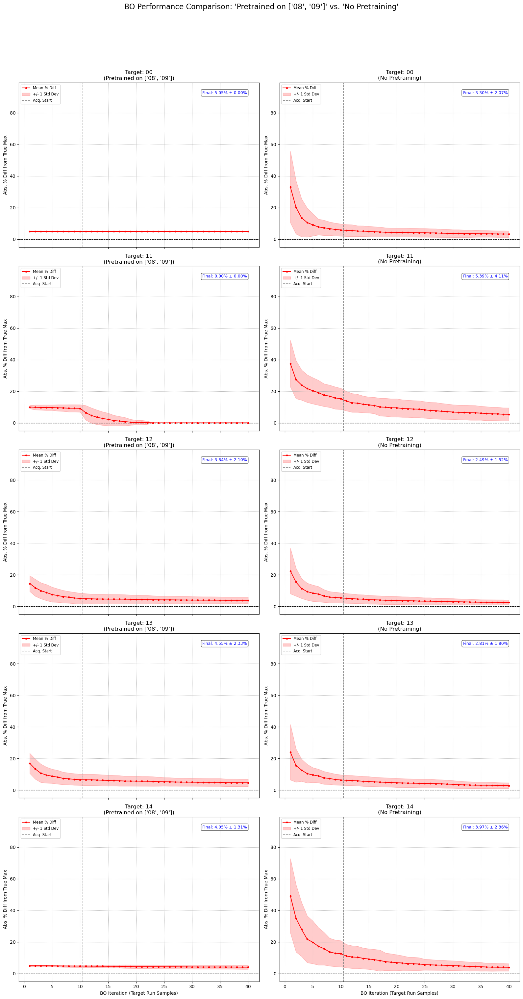


--- Aggregated Final Performance Summary ---
(Mean +/- Std Dev of Abs. % Diff from True Max)
  Target Run: 00
    Pretrained on ['08', '09']: 5.05% +/- 0.00%
    No Pretraining: 3.30% +/- 2.07%
  Target Run: 11
    Pretrained on ['08', '09']: 0.00% +/- 0.00%
    No Pretraining: 5.39% +/- 4.11%
  Target Run: 12
    Pretrained on ['08', '09']: 3.84% +/- 2.10%
    No Pretraining: 2.49% +/- 1.52%
  Target Run: 13
    Pretrained on ['08', '09']: 4.55% +/- 2.33%
    No Pretraining: 2.81% +/- 1.80%
  Target Run: 14
    Pretrained on ['08', '09']: 4.05% +/- 1.31%
    No Pretraining: 3.97% +/- 2.36%

===== FIXED PRETRAIN VS NO PRETRAIN EVALUATION FINISHED =====


In [86]:
# --- ASSUME df, feature_groups, RFSurrogateWrapper, get_scaled_data, ---
# --- find_nearest_available_point, and run_bo_on_discrete_data ARE DEFINED ---

TARGET_COL_TO_MAXIMIZE = "fcv1_i_mean"
SELECTED_FEATURE_GROUP_NAME = "S"
current_features = get_features(feature_groups[SELECTED_FEATURE_GROUP_NAME])

# Define the fixed set of pretraining runs for the "with pretraining" scenario
FIXED_PRETRAIN_RUNS_FOR_COMPARISON = ["08", "09"] # Example: pretrain on runs "00" and "01"

# Define the list of target runs you want to evaluate
TARGET_RUNS_TO_EVALUATE = ["00", "11", "12", "13", "14"] # Example target runs

# Iteration counts (same for "with pretrain" and "no pretrain" for direct comparison)
N_INITIAL_PER_TARGET_SCENARIO = 10
N_BO_ITER_PER_TARGET_SCENARIO = 30

skopt_config = {
    'acq_func': 'EI', 'acq_func_kwargs': {'xi': 0.05}, 'acq_optimizer': 'sampling'
}
rf_config = {
    'n_estimators': 100, 'min_samples_leaf': 3, 'n_jobs': -1
}

N_SEEDS_PER_SCENARIO_EVAL = 100
BASE_SEED_FOR_SCENARIO_EVAL = 2000

all_involved_runs_check = list(set(FIXED_PRETRAIN_RUNS_FOR_COMPARISON + TARGET_RUNS_TO_EVALUATE))
if not all(rid in df['run_id'].unique() for rid in all_involved_runs_check):
    print(f"Error: Not all specified run_ids exist in the DataFrame.")
else:
    comparison_results = evaluate_fixed_pretrain_on_targets(
        df=df,
        fixed_pretrain_run_ids_to_compare=FIXED_PRETRAIN_RUNS_FOR_COMPARISON,
        target_run_ids_to_evaluate=TARGET_RUNS_TO_EVALUATE,
        feature_group_cols=current_features,
        target_col=TARGET_COL_TO_MAXIMIZE,
        n_initial_points_per_target=N_INITIAL_PER_TARGET_SCENARIO,
        n_bo_iterations_per_target=N_BO_ITER_PER_TARGET_SCENARIO,
        skopt_optimizer_params=skopt_config,
        rf_wrapper_params=rf_config,
        n_seeds_per_scenario=N_SEEDS_PER_SCENARIO_EVAL,
        base_random_seed=BASE_SEED_FOR_SCENARIO_EVAL,
        plot_aggregated_results=True,
        confidence_level=0.95
    )
